<div style="background-color:#c3faf6; color:#222222; border:3px solid #bee5eb; padding:12px 14px; border-radius:10px; margin:10px 0;">

# How Facial Recognition Bias Compounds Across Race and Gender as Subjects Age


**CS109b Group #103**:Jenni Arakaki, Laine Roper, Arian Nzioka
**Project #18**: 

Project Proposal: https://drive.google.com/file/d/1yRPxpvg4jQc8gwzPgP_ptiSU6Qs4qmL1/view

# Problem Statement

We've started this project is to train and optimize a visual model to correct facial recognition bias across age, race and gender. 

The motivation is that facial features vary across race and gender as subjects age. A naive model will fail to capture these nuances, our model corrects fot this bais in facial change with aging while tracking them across race and gender.  

**To investigate whether bais that appears modest or acceptable at younger ages becomes more pronounced and unequally distributes at older ages, while tracking race and gender complexity.**


In [1]:
# Standard library
import os
import gc
import time
import warnings

# Numerical computing and data processing
import numpy as np
import pandas as pd
import random
from pathlib import Path
from collections import Counter
import zipfile

# external utilities
import kagglehub
import hashlib

# Visualization
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
from pathlib import Path
import seaborn as sns

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR
from torch.cuda.amp import GradScaler, autocast
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, models, transforms
from torchvision.models import ResNet50_Weights

# facenet pytorch
from facenet_pytorch import MTCNN
import cv2
from retinaface import RetinaFace

# UMAP
from tqdm import tqdm
from umap import UMAP

SEED = 1090

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

# Suppress warnings
warnings.filterwarnings('ignore')


cuda


### Downloading/Accessing data:
1) Download data from https://www.kaggle.com/datasets/jangedoo/utkface-new.
2) kagglehub library downloads and stores data in `./cache` directory for reproducibility

In [2]:
path = kagglehub.dataset_download("jangedoo/utkface-new")
utk_path = next(Path(path).rglob("UTKFace"))

print("Path Exists  :", utk_path.exists())

print(f"\nDataset downloaded to:", utk_path)

Path Exists  : True

Dataset downloaded to: C:\Users\arian\.cache\kagglehub\datasets\jangedoo\utkface-new\versions\1\UTKFace


In [3]:
# change paths as needed
class FlatImageDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = Path(img_dir)
        self.files   = [f for f in self.img_dir.rglob("*")
                        if f.name.endswith(".jpg")
                        or f.name.endswith(".jpeg")
                        or f.name.endswith(".png")]
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, self.files[idx].name

dataset = FlatImageDataset(utk_path)

size = 0
img_count = 0
for dirpath, dirnames, filenames in os.walk(utk_path):
    for f in filenames:
        fp = os.path.join(dirpath, f)
        size += os.path.getsize(fp)
        img_count += 1

print(f"Number of images : {img_count}")
print(f"Size on disk   : {size / (1024**2):.2f} MB")

Number of images : 23708
Size on disk   : 114.43 MB


## Datawrangling, EDA, Visualizations

### Labels:

The UTK dataset is a facial close-up collection of labeled images. Each image data features is embedded in the file name, formated like [age]_[gender]_[race]_[date&time].jpg

- `age` is an integer from `0`to `116`, indicating the age
- `gender` is either 0 `male` or 1 `female`
- `race` is an integer from 0 to 4, denoting `White`, `Black`, `Asian`, `Indian`, and `Others` (like `Hispanic`, `Latino`, `Middle Eastern`).
- `date&time` is in the format of `yyyymmddHHMMSSFFF`, showing the date and time an image was collected to UTKFace

**DataFrame from Dataset**

In [4]:
records = []
for fpath in dataset.files:       
    filename = fpath.name
    parts = filename.split("_")
    if len(parts) < 4:
        continue
    try:
        age = int(parts[0])
        gender = int(parts[1])
        race = int(parts[2])
    except ValueError:
        print(f'Error with {filename}')
        continue
    with Image.open(fpath) as im:
        img = im.convert('RGB').copy()
    records.append({
        'age'     : age,
        'gender'  : gender,
        'race'    : race,
        'image'   : img,
        'filename': filename,
    })

df = pd.DataFrame(records)
print(f"\nDataFrame shape: {df.shape}")
display(df.head())


DataFrame shape: (23705, 5)


,age,gender,race,image,filename
0,100,0,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_0_0_20170112213500903.jpg.chip.jpg
1,100,0,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_0_0_20170112215240346.jpg.chip.jpg
2,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170110183726390.jpg.chip.jpg
3,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170112213001988.jpg.chip.jpg
4,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170112213303693.jpg.chip.jpg


### Visualizing Dataset

filename    20_1_0_20170117193616027.jpg.chip.jpg
Name: 2846, dtype: object


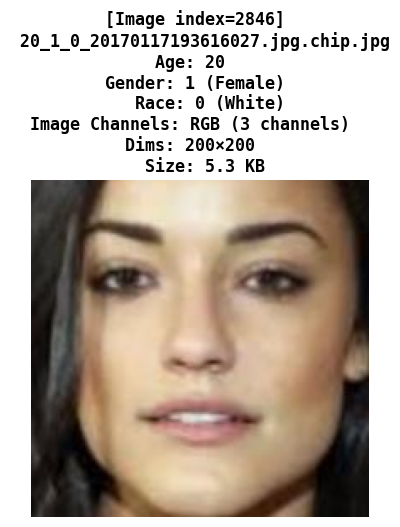

In [5]:
sampled = df.sample(1, random_state=SEED)
row = sampled.iloc[0]
row_index = sampled.index[0]

print(row[-1:])

img = row['image']
width, height = img.size
mode = img.mode
channels = len(img.getbands())
file_path = utk_path / row['filename']
file_size_kb = file_path.stat().st_size / 1024
race_map = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}

fig, ax = plt.subplots(figsize=(4, 5))
ax.imshow(img)
ax.axis('off')
ax.set_title(
    f"[Image index={row_index}] \n {row['filename']}\n"
    f"Age: {row['age']}  \n "
    f"Gender: {row['gender']} ({['Male','Female'][row['gender']]})  \n  "
    f"Race: {row['race']} ({race_map[row['race']]})\n"
    f"Image Channels: {mode} ({channels} channels)  \n"
    f"Dims: {width}×{height}  \n "
    f"Size: {file_size_kb:.1f} KB",
    fontsize=12,
    fontweight='bold',
    family='monospace'
)
plt.tight_layout()
plt.show()

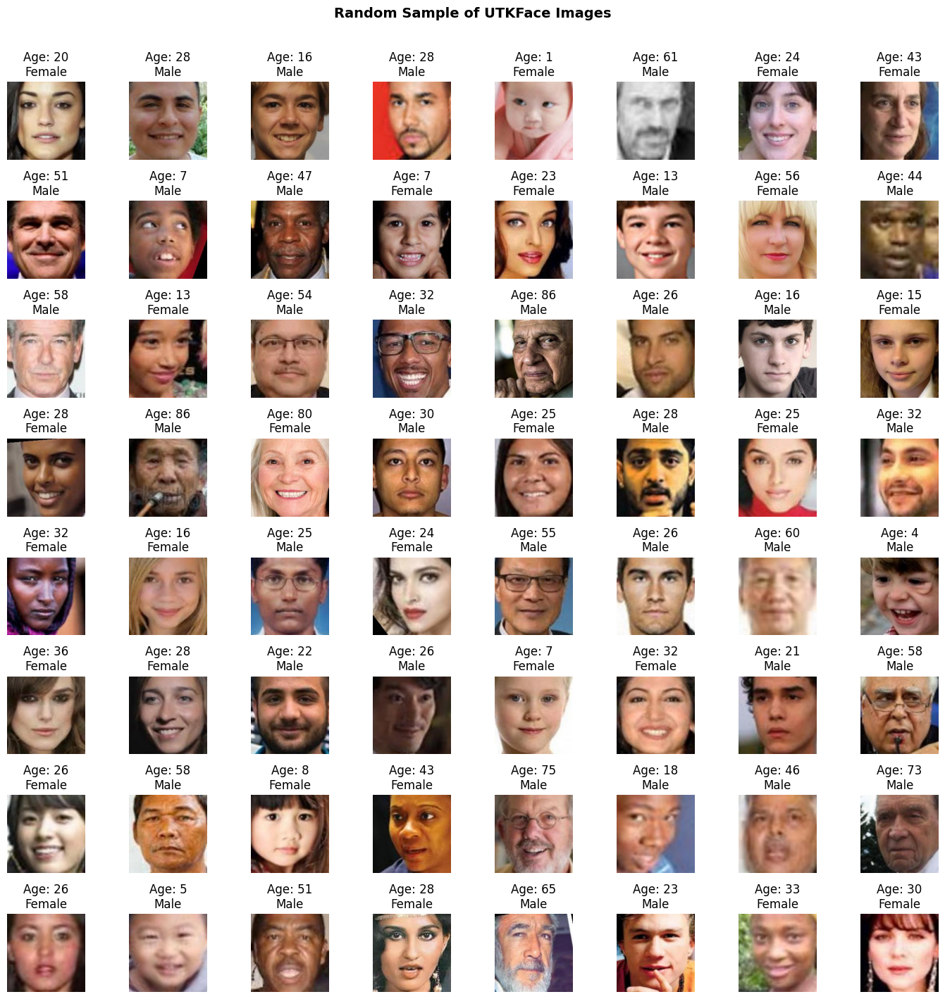

In [6]:
img_path = Path(f'{path}')

dataset = datasets.ImageFolder( img_path )
sample_df = df.sample(64, random_state=SEED).reset_index(drop=True)

fig, axes = plt.subplots(8, 8, figsize=(14, 14))
axes = axes.ravel()

for i, row in sample_df.iterrows():
    ax = axes[i]
    ax.imshow(row['image'])
    ax.set_title(f"Age: {row['age']}\n{['Male','Female'][row['gender']]}", fontsize=12)
    ax.axis('off')

plt.suptitle('Random Sample of UTKFace Images', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

## Preliminary EDA

### Demographics: Age, Gender and Race Distribution

#### Gender

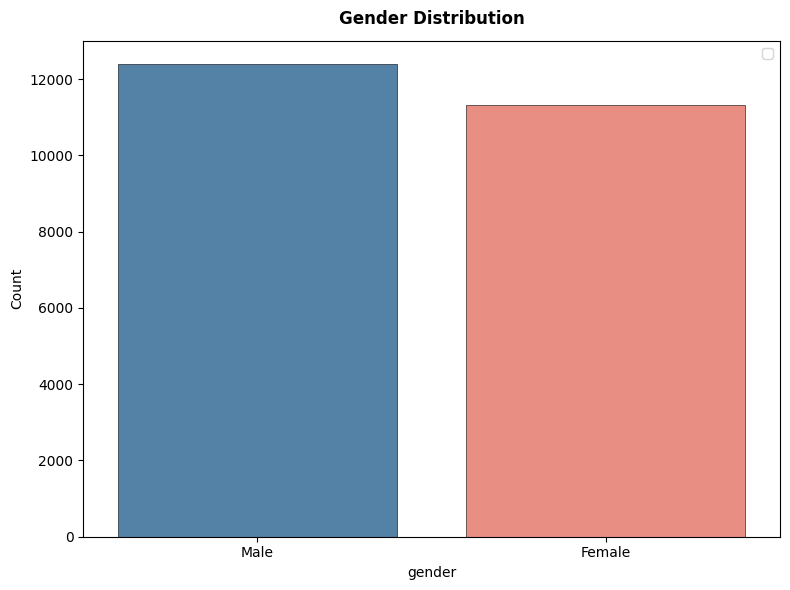

In [7]:
fig, ax = plt.subplots(figsize=(8, 6))
sns.countplot(
    data=df,
    x='gender',
    hue='gender',
    palette={0: "steelblue", 1: "salmon"},
    edgecolor="black",
    linewidth=0.4,
    ax=ax
)
ax.set_title("Gender Distribution", fontsize=12, fontweight="bold", pad=12)
ax.set_ylabel("Count")
ax.set_xticks([0, 1])
ax.set_xticklabels(["Male", "Female"])
ax.legend([])
ax.spines[["top", "right"]].set_visible(True)
plt.tight_layout()
plt.show()

#### Gender by Age 

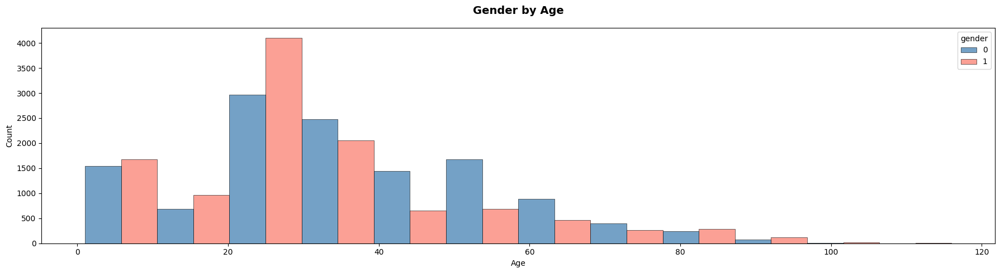

,Male,Female,age_range,total,male_pct,female_pct,pct_of_all
0,1447,1615,0–9,3062,47.3,52.7,12.9
1,681,850,10–19,1531,44.5,55.5,6.5
2,3062,4282,20–29,7344,41.7,58.3,31.0
3,2477,2059,30–39,4536,54.6,45.4,19.1
4,1519,726,40–49,2245,67.7,32.3,9.5
5,1659,640,50–59,2299,72.2,27.8,9.7
6,844,472,60–69,1316,64.1,35.9,5.6
7,440,259,70–79,699,62.9,37.1,2.9
8,203,301,80–89,504,40.3,59.7,2.1
9,52,85,90–99,137,38.0,62.0,0.6


In [8]:
fig, ax = plt.subplots(figsize=(18, 5))

sns.histplot(
    data=df,
    x="age",
    hue="gender",
    binwidth=10,          
    multiple="dodge",    
    edgecolor="black",
    linewidth=0.4,
    palette={0: "steelblue", 1: "salmon"},
    ax=ax
)

ax.set_title("Gender by Age", fontsize=14, fontweight="bold", pad=18)
ax.set_xlabel("Age")
ax.set_ylabel("Count")
ax.spines[["top", "right"]].set_visible(True)

plt.tight_layout()
plt.show()


bin_width = 10
df['age_bin'] = (df['age'] // bin_width) * bin_width

stats_df = (
    df.groupby(['age_bin', 'gender'])
    .size()
    .unstack(fill_value=0)
    .rename(columns={0: 'Male', 1: 'Female'})
    .reset_index()
)

stats_df['age_range']  = stats_df['age_bin'].apply(lambda x: f"{x}–{x + bin_width - 1}")
stats_df['total']      = stats_df['Male'] + stats_df['Female']
stats_df['male_pct']   = (stats_df['Male']   / stats_df['total'] * 100).round(1)
stats_df['female_pct'] = (stats_df['Female'] / stats_df['total'] * 100).round(1)
stats_df['pct_of_all'] = (stats_df['total']  / stats_df['total'].sum() * 100).round(1)
stats = stats_df.reset_index()
stats.columns.name = None
stats = stats.drop(columns=['age_bin','index', 0], errors='ignore')
display(stats)


#### Race

In [9]:
races = df['race']
race_labels_map = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}
race_counts = Counter(races)

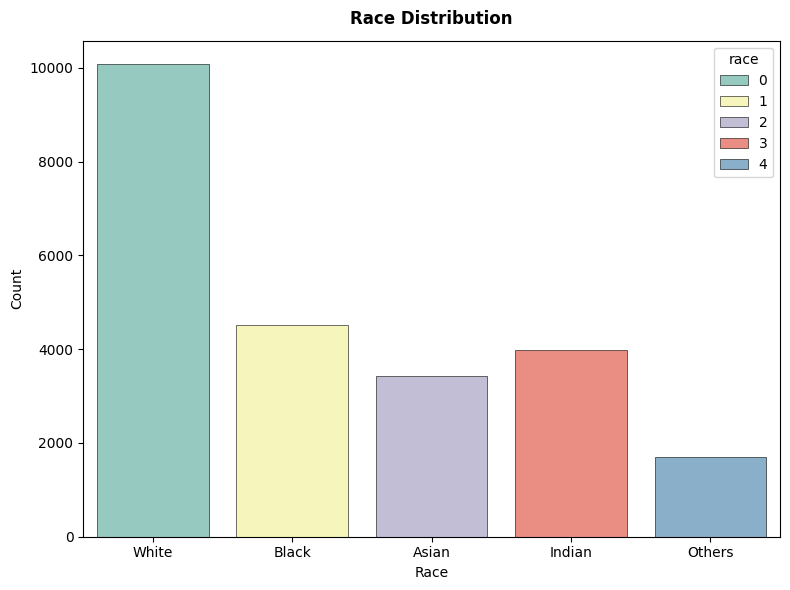

In [10]:
# Race distribution
fig, ax = plt.subplots(figsize=(8,6))

sns.countplot(
    data=df,
    x='race', 
    hue='race',
    palette=dict(enumerate(sns.color_palette("Set3", 5))),
    edgecolor='black',
    linewidth=0.4,
    ax=ax
)

ax.set_title("Race Distribution", fontsize=12, fontweight='bold', pad=12)
ax.set_xlabel('Race')
ax.set_ylabel("Count")
ax.set_xticks(range(5))
ax.set_xticklabels([race_labels_map[i] for i in range(5)])
ax.spines[["top", "right"]].set_visible(True)
plt.tight_layout()
plt.show()

#### Race by Age

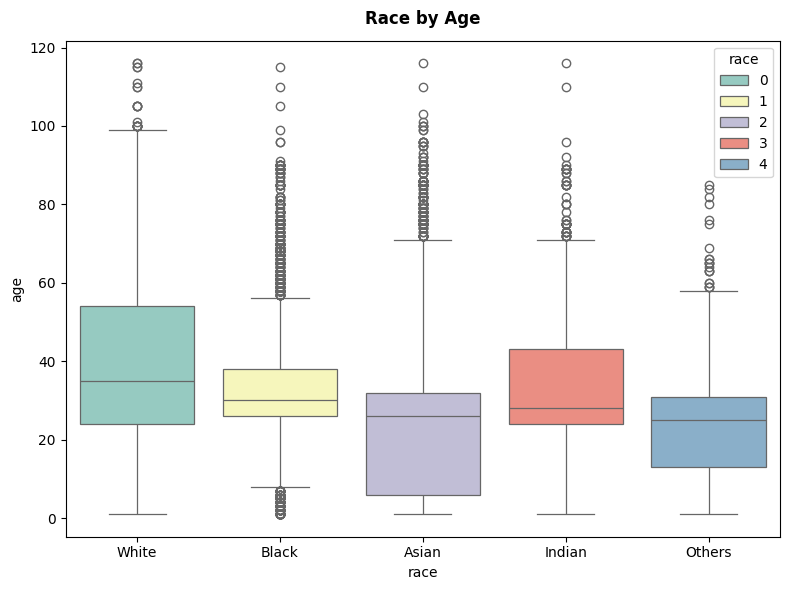

In [11]:
fig, ax = plt.subplots(figsize=(8,6))

sns.boxplot(
    data=df,
    x="race", 
    y="age",
    hue='race',
    palette=dict(enumerate(sns.color_palette("Set3", 5))),
    linewidth=0.9,
    ax=ax
)
ax.set_title("Race by Age", fontsize=12, fontweight='bold', pad=12)
ax.set_xlabel('race')
ax.set_ylabel("age")
ax.set_xticks(range(5))
ax.set_xticklabels([race_labels_map[i] for i in range(5)])
ax.spines[["top", "right"]].set_visible(True)
plt.tight_layout()
plt.show()

#### Race by Gender

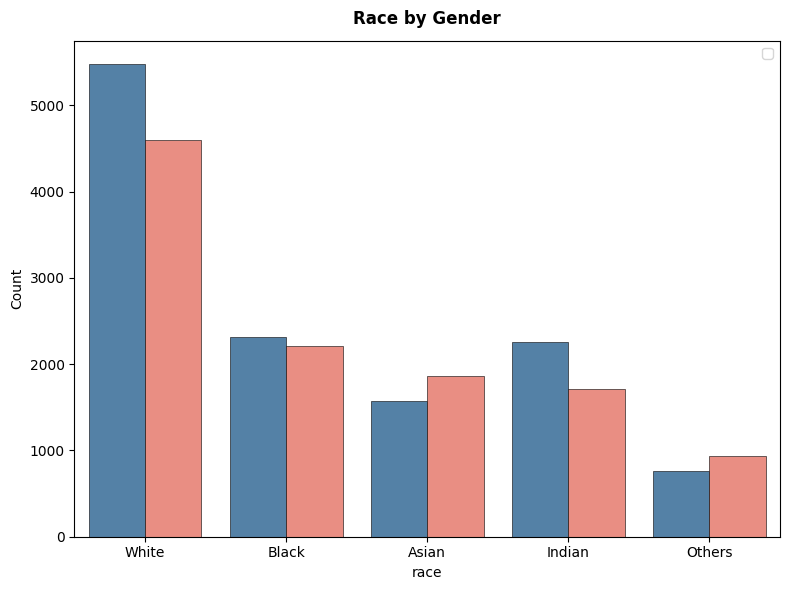

In [12]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    data=df,
    x='race',
    hue='gender',
    palette={0: "steelblue", 1: "salmon"},
    edgecolor="black",
    linewidth=0.4,
    ax=ax
)
ax.set_title("Race by Gender", fontsize=12, fontweight="bold", pad=12)
ax.set_ylabel("Count")
ax.set_xticks(range(5))
ax.set_xticklabels([race_labels_map[i] for i in range(5)])
ax.legend([])
ax.spines[["top", "right"]].set_visible(True)
plt.tight_layout()
plt.show()


### Key EDA Takeaways

#### 1. Gender distribution is relatively balanced
The dataset contains ~52% male and ~48% female samples

This indicates minimal gender imbalance overall

However, this balance does not guarantee fairness across subgroups (e.g., within each race or age group)

#### 2. Significant racial imbalance exists
White faces dominate (~42.5%)

Other groups are underrepresented:

- Black: ~19%
- Indian: ~16.8%
- Asian: ~14.5%
- Others: ~7.1%

#### 3. Age distribution is skewed (non-uniform)
Strong concentration in young adults (20–35)

Noticeable spike in very young ages (children/babies)

Teens are underrepresented

Gradual decline in samples for older ages

#### 4. Age distribution differs across gender
Males have a higher median age than females

Male age distribution is shifted older overall

Females are more concentrated in younger ranges

#### 5. Age distribution differs across race (important)
White group appears to have:

- higher median age
- wider spread

Other groups (e.g., Asian, Others) skew younger
Some races have fewer older individuals

#### 6. Gender imbalance varies across races
Some races (e.g., Indian) have more males than females

Others are more balanced

“Others” category is small and uneven

## Data Anomaly Detection

### Duplicates Search on Raw Pixels (hashing)

In [13]:
def hash_image(img):
    """Generate MD5 hash from image pixels."""
    return hashlib.md5(np.array(img).tobytes()).hexdigest()

print("Hashing images...")
df_hash = df.copy()
df_hash['hash'] = [hash_image(img) for img in df['image']]

n_before = len(df)
duplicates = df_hash[df_hash.duplicated(subset='hash', keep=False)]
print(f"Total duplicate images (including originals): {len(duplicates)}")
print(f"Unique duplicate hashes: {df_hash['hash'].duplicated().sum()}")
print(len(df_hash))

Hashing images...
Total duplicate images (including originals): 765
Unique duplicate hashes: 390
23705


23705
Unique duplicate groups: 375


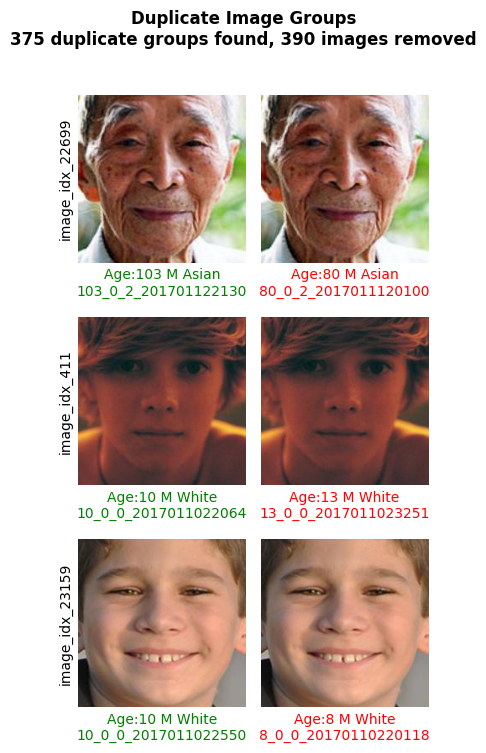

In [14]:
print(len(df_hash))
duplicate_hashes = df_hash[df_hash.duplicated(subset='hash', keep=False)]['hash'].unique()
print(f"Unique duplicate groups: {len(duplicate_hashes)}")

N_GROUPS = 3
selected_hashes = duplicate_hashes[:N_GROUPS]

dup_rows = []
for h in selected_hashes:
    group = df_hash[df_hash['hash'] == h].reset_index().copy()
    group.rename(columns={'index': 'df_index'}, inplace=True)
    dup_rows.append(group)

max_group_size = max(len(g) for g in dup_rows)

fig, axes = plt.subplots(N_GROUPS, max_group_size, figsize=(max_group_size * 2, N_GROUPS * 2.5))

for row_i, group in enumerate(dup_rows):
    for col_i in range(max_group_size):
        ax = axes[row_i, col_i]
        if col_i < len(group):
            r = group.iloc[col_i]
            ax.imshow(r['image'])
            ax.set_xlabel(
                f"Age:{r['age']} {'M' if r['gender']==0 else 'F'} "
                f"{['White','Black','Asian','Indian','Others'][r['race']]}\n"
                f"{r['filename'][:20]}",
                fontsize=10,
                color='red' if col_i > 0 else 'green',
                labelpad=4
            )
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_visible(False)
                
    axes[row_i, 0].set_ylabel(f"image_idx_{group['df_index'].tolist()[1]}", fontsize=10, rotation=90)
plt.suptitle(
    f"Duplicate Image Groups\n"
    f"{len(duplicate_hashes)} duplicate groups found, "
    f"{df_hash['hash'].duplicated().sum()} images removed",
    fontsize=12, fontweight='bold', y=1.0
)
plt.tight_layout()
plt.show()

### Understanding Duplicate Samples

In [15]:
# Understand the duplicate structure
dup_groups = duplicates.groupby('hash').size()
print("Duplicate group size distribution:")
print(dup_groups.value_counts().sort_index())
# e.g. 2 copies: 350 groups, 3 copies: 30 groups, etc.

# Separate into good (first occurrence) and bad (subsequent occurrences)
good_dups = df_hash[df_hash.duplicated(subset='hash', keep='first') == False]  # originals
bad_dups  = df_hash[df_hash.duplicated(subset='hash', keep='first') == True]   # true duplicates

print(f"\nOriginals (keep=first) : {len(good_dups):,}")
print(f"True duplicates        : {len(bad_dups):,}")

Duplicate group size distribution:
2    361
3     13
4      1
Name: count, dtype: int64

Originals (keep=first) : 23,315
True duplicates        : 390


In [16]:
def check_duplicate_consistency(duplicates):
    rows = []
    for hash_val, group in duplicates.groupby('hash'):
        age_vals    = group['age'].tolist()
        gender_vals = group['gender'].unique()
        race_vals   = group['race'].unique()
        rows.append({
            'hash'            : hash_val,
            'n_duplicates'    : len(group),
            'ages'            : age_vals,
            'gender_consistent': len(gender_vals) == 1,
            'race_consistent'  : len(race_vals)   == 1,
            'fully_consistent' : len(gender_vals) == 1 and len(race_vals) == 1,
            'gender_values'   : gender_vals.tolist(),
            'race_values'     : race_vals.tolist(),
        })

    consistency_df = pd.DataFrame(rows).sort_values('ages', ascending=False)

    print(f"Total duplicate groups : {len(consistency_df):,}")
    print(f"Gender inconsistent    : {(~consistency_df['gender_consistent']).sum():,}")
    print(f"Race inconsistent      : {(~consistency_df['race_consistent']).sum():,}")
    print(f"Fully consistent       : {consistency_df['fully_consistent'].sum():,}")

    return consistency_df

# usage
consistency_df = check_duplicate_consistency(duplicates)
display(consistency_df.head(30))

Total duplicate groups : 375
Gender inconsistent    : 40
Race inconsistent      : 70
Fully consistent       : 271


,hash,n_duplicates,ages,gender_consistent,race_consistent,fully_consistent,gender_values,race_values
235,a204df6c3af5f0df7a125e4ee23d62ee,2,"[103, 80]",True,True,True,[0],[2]
329,e2b031eb952791cb601bcb62376f1ad5,2,"[96, 96]",True,False,False,[1],"[0, 1]"
183,7e79f816f937a1716c04d2f9dfeec9b4,2,"[86, 88]",False,True,False,"[0, 1]",[2]
123,52f8b10914e47e57fde0eb1bcc9c7200,3,"[84, 85, 85]",True,True,True,[1],[0]
218,9670fe7e48a08b1a49e77ceda8e83817,2,"[82, 90]",True,True,True,[0],[0]
210,9206ff51acb0b802595cf856681265dd,2,"[81, 82]",True,True,True,[0],[0]
173,789d717d657548c610529ff08a3ec9d3,2,"[80, 80]",True,True,True,[0],[0]
89,3b1c2b7a9c2be11814090f0ac74c6b24,2,"[80, 80]",True,True,True,[0],[0]
357,f5e3c64b3d2fde2f0150cfd8767dc7a3,2,"[77, 99]",False,False,False,"[0, 1]","[0, 2]"
257,b18f6594a48bf77e3495df7905bd6818,2,"[76, 76]",True,True,True,[0],[0]


Inconsistent groups: 104


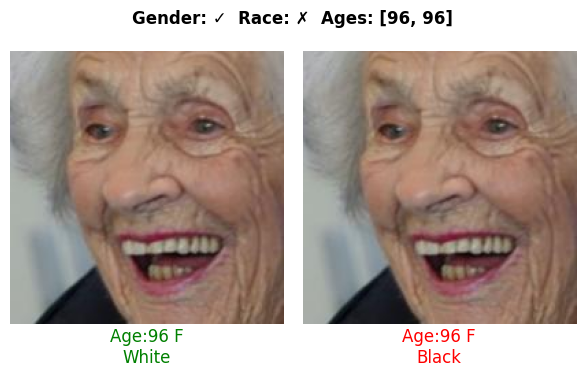

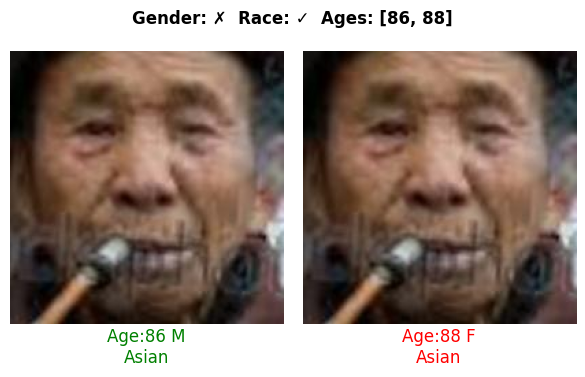

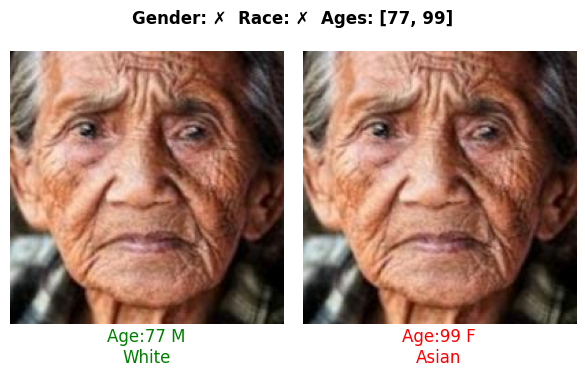

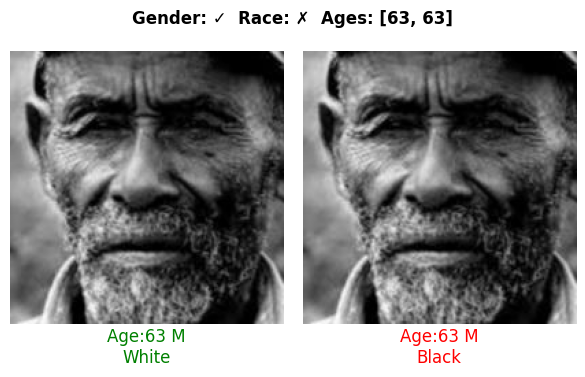

In [17]:
N_GROUPS = 4
fontsize = 12

def plot_inconsistent_groups(consistency_df, df, fontsize=fontsize, N_GROUPS=N_GROUPS):
    inconsistent_df = consistency_df[
        ~consistency_df['gender_consistent'] | ~consistency_df['race_consistent']
    ]
    print(f"Inconsistent groups: {len(inconsistent_df):,}")

    for _, group_row in list(inconsistent_df.iterrows())[:N_GROUPS]:
        group_imgs = df[df['hash'] == group_row['hash']]
        n = len(group_imgs)
        fig, axes = plt.subplots(1, n, figsize=(n * 3, 3.5))
        axes = [axes] if n == 1 else axes

        for i, (_, r) in enumerate(group_imgs.iterrows()):
            ax = axes[i]
            ax.imshow(r['image'])
            ax.set_xlabel(
                f"Age:{r['age']} {'M' if r['gender']==0 else 'F'}\n"
                f"{['White','Black','Asian','Indian','Others'][r['race']]}",
                fontsize=fontsize,
                color='red' if i > 0 else 'green',
                labelpad=3
            )
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_visible(False)

        gender_ok = "✓" if group_row['gender_consistent'] else "✗"
        race_ok   = "✓" if group_row['race_consistent']   else "✗"
        plt.suptitle(
            f"Gender: {gender_ok}  Race: {race_ok}  Ages: {group_row['ages']}",
            fontsize=fontsize, fontweight='bold'
        )
        plt.tight_layout()
        plt.show()

    return inconsistent_df

inconsistent_df = plot_inconsistent_groups(consistency_df, df_hash, fontsize, N_GROUPS)

The images show misentries in all fields of the dataset, `age`, `gender` and `race`. This is going to be problematic as it will corrupt the embeddings and thus the entire model will be affected. One way to resolve this anomaly is by using SOTA pretrained models to independently detect `age`, `gender` and `race` to pick the highest confidence samples and recreate a clean dataset.

### Noisy Samples (Non-faces)

In [48]:

def preprocess(img_pil, enhanced=False):
    img = enhance(img_pil) if enhanced else img_pil
    return img.convert('L').convert('RGB').resize((160, 160))

print("Loading images...")
images = [row['image'] for _, row in df.iterrows()]

gray_images   = [preprocess(img) for img in tqdm(images, desc="Preprocessing")]

Loading images...


Preprocessing: 100%|███████████████████████████████████████████████████████████| 23705/23705 [00:12<00:00, 1834.13it/s]


### MTCNN + HaarCascadeClassifier Fallback + RetinaFace Fallback

In [65]:
mtcnn = MTCNN(
    keep_all      = True,
    device        = device,
    post_process  = False,
    min_face_size = 10,             # smaller to catch babies
    thresholds    = [0.3, 0.4, 0.5] # more permissive
)

# haar cascade — good fallback for elderly/angled faces
haar = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_alt2.xml')

def detect_face(img_pil):
    """Returns (has_face, confidence, face_area) using MTCNN + Haar fallback."""
    w, h      = img_pil.size
    img_gray  = img_pil.convert('L').convert('RGB').resize((160, 160))
    img_cv    = np.array(img_pil.convert('L'))  # grayscale for haar

    # ── MTCNN ─────────────────────────────────────────────────────────────────
    try:
        boxes, probs = mtcnn.detect(img_gray)
        if boxes is not None and len(boxes) > 0:
            best_idx  = np.argmax(probs)
            best_prob = float(probs[best_idx])
            best_box  = boxes[best_idx]
            bw = best_box[2] - best_box[0]
            bh = best_box[3] - best_box[1]
            face_area = (bw * bh) / (160 * 160)
            if best_prob >= 0.40 and face_area >= 0.03:
                return True, round(best_prob, 4), round(face_area, 4)
    except Exception:
        pass

    # ── Haar fallback ─────────────────────────────────────────────────────────
    try:
        faces = haar.detectMultiScale(
            img_cv,
            scaleFactor = 1.05,   # finer scale steps
            minNeighbors= 3,      # less strict
            minSize     = (20, 20)
        )
        if len(faces) > 0:
            x, y, fw, fh = max(faces, key=lambda f: f[2] * f[3])  # largest face
            face_area = (fw * fh) / (w * h)
            if face_area >= 0.03:
                return True, 0.6, round(face_area, 4)  # fixed confidence for haar
    except Exception:
        pass

    return False, 0.0, 0.0

# ── Detect ────────────────────────────────────────────────────────────────────
BATCH_SIZE = 64
results    = []

# ── MTCNN batch detection ─────────────────────────────────────────────────────
print("Running MTCNN batch detection...")
mtcnn_results = {}
for i in tqdm(range(0, len(gray_images), BATCH_SIZE), desc="MTCNN"):
    batch = gray_images[i:i + BATCH_SIZE]
    try:
        boxes_batch, probs_batch = mtcnn.detect(batch)
    except Exception:
        boxes_batch = [None] * len(batch)
        probs_batch = [None] * len(batch)

    for j, (boxes, probs) in enumerate(zip(boxes_batch, probs_batch)):
        idx = i + j
        try:
            if boxes is not None and len(boxes) > 0:
                best_idx  = np.argmax(probs)
                best_prob = float(probs[best_idx])
                best_box  = boxes[best_idx]
                bw        = best_box[2] - best_box[0]
                bh        = best_box[3] - best_box[1]
                face_area = (bw * bh) / (160 * 160)
                if best_prob >= 0.40 and face_area >= 0.03:
                    mtcnn_results[idx] = (True, round(best_prob, 4), round(face_area, 4))
                    continue
        except Exception:
            pass
        mtcnn_results[idx] = (False, 0.0, 0.0)

# ── Haar fallback ─────────────────────────────────────────────────────────────
print("Running Haar fallback...")
for idx, (has_face, conf, area) in tqdm(mtcnn_results.items(), desc="Haar"):
    if not has_face:
        img_cv = np.array(images[idx].convert('L'))
        w, h   = images[idx].size
        try:
            faces = haar.detectMultiScale(
                img_cv, scaleFactor=1.05, minNeighbors=3, minSize=(20, 20)
            )
            if len(faces) > 0:
                x, y, fw, fh = max(faces, key=lambda f: f[2] * f[3])
                face_area    = (fw * fh) / (w * h)
                if face_area >= 0.03:
                    mtcnn_results[idx] = (True, 0.6, round(face_area, 4))
        except Exception:
            pass

# ── RetinaFace fallback ───────────────────────────────────────────────────────
print("Running RetinaFace fallback...")
for idx, (has_face, conf, area) in tqdm(mtcnn_results.items(), desc="RetinaFace"):
    if not has_face:
        try:
            img_np = np.array(images[idx].convert('RGB'))
            faces  = RetinaFace.detect_faces(img_np)
            if isinstance(faces, dict) and len(faces) > 0:
                best        = max(faces.values(), key=lambda f: f['score'])
                score       = best['score']
                x1, y1, x2, y2 = best['facial_area']
                w, h        = images[idx].size
                face_area   = ((x2 - x1) * (y2 - y1)) / (w * h)
                if score >= 0.5 and face_area >= 0.03:
                    mtcnn_results[idx] = (True, round(score, 4), round(face_area, 4))
        except Exception:
            pass

# ── Build results df — AFTER all three detectors ──────────────────────────────
results = []
for idx in range(len(df)):
    has_face, conf, area = mtcnn_results.get(idx, (False, 0.0, 0.0))
    results.append({
        'df_index'  : idx,
        'filename'  : df.iloc[idx]['filename'],
        'age'       : df.iloc[idx]['age'],
        'gender'    : df.iloc[idx]['gender'],
        'race'      : df.iloc[idx]['race'],
        'has_face'  : has_face,
        'confidence': conf,
        'face_area' : area,
    })

detect_df  = pd.DataFrame(results)

Running MTCNN batch detection...


MTCNN: 100%|█████████████████████████████████████████████████████████████████████████| 371/371 [03:13<00:00,  1.92it/s]


Running Haar fallback...


Haar: 100%|███████████████████████████████████████████████████████████████████| 23705/23705 [00:02<00:00, 10774.25it/s]


Running RetinaFace fallback...


RetinaFace: 100%|████████████████████████████████████████████████████████████████| 23705/23705 [06:21<00:00, 62.09it/s]


In [67]:
def build_clean_df(df, detect_df):
    clean_mask = detect_df['has_face']
    noise_mask = ~clean_mask
    clean_df   = df.copy()[clean_mask.values].reset_index(drop=True)
    noise_df   = detect_df[noise_mask].sort_values('confidence', ascending=True)

    print(f"Total images : {len(df):,}")
    print(f"Clean images : {clean_mask.sum():,}  ({clean_mask.mean()*100:.1f}%)")
    print(f"Noise images : {noise_mask.sum():,}  ({noise_mask.mean()*100:.1f}%)")

    return clean_df, noise_df, clean_mask, noise_mask

clean_df, noise_df, clean_mask, noise_mask = build_clean_df(df, detect_df)

Total images : 23,705
Clean images : 23,631  (99.7%)
Noise images : 74  (0.3%)


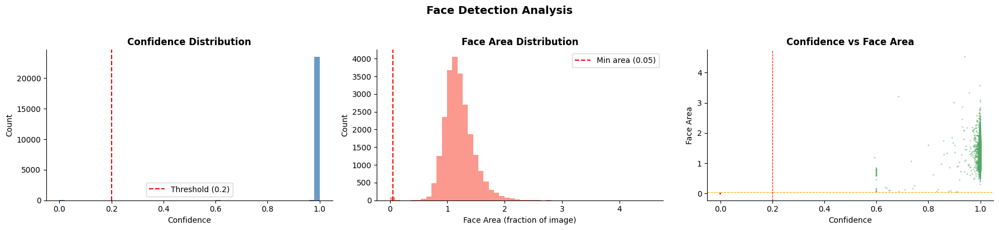

In [68]:
# ── Confidence + Area Scatter ─────────────────────────────────────────────────
CONF_THRESHOLD = 0.2
AREA_THRESHOLD = 0.05

fig, axes = plt.subplots(1, 3, figsize=(18, 4))

sns.histplot(
    detect_df['confidence'], 
    bins=50, 
    color='steelblue', 
    edgecolor='none', 
    alpha=0.8, 
    ax=axes[0]
)
axes[0].axvline(CONF_THRESHOLD, color='red', linestyle='--', label=f'Threshold ({CONF_THRESHOLD})')
axes[0].set_title("Confidence Distribution", fontweight='bold')
axes[0].set_xlabel("Confidence")
axes[0].set_ylabel("Count")
axes[0].legend()
axes[0].spines[['top', 'right']].set_visible(False)

sns.histplot(
    detect_df['face_area'], 
    bins=50, 
    color='salmon', 
    edgecolor='none', 
    alpha=0.8, 
    ax=axes[1]
)
axes[1].axvline(AREA_THRESHOLD, color='red', linestyle='--', label=f'Min area ({AREA_THRESHOLD})')
axes[1].set_title("Face Area Distribution", fontweight='bold')
axes[1].set_xlabel("Face Area (fraction of image)")
axes[1].set_ylabel("Count")
axes[1].legend()
axes[1].spines[['top', 'right']].set_visible(False)

colors = ['#55A868' if c else '#C44E52' for c in clean_mask]
axes[2].scatter(detect_df['confidence'], detect_df['face_area'], c=colors, s=1, alpha=0.4)
axes[2].axvline(CONF_THRESHOLD, color='red',    linestyle='--', linewidth=0.8)
axes[2].axhline(AREA_THRESHOLD, color='orange', linestyle='--', linewidth=0.8)
axes[2].set_title("Confidence vs Face Area", fontweight='bold')
axes[2].set_xlabel("Confidence")
axes[2].set_ylabel("Face Area")
axes[2].spines[['top', 'right']].set_visible(False)

plt.suptitle("Face Detection Analysis", fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

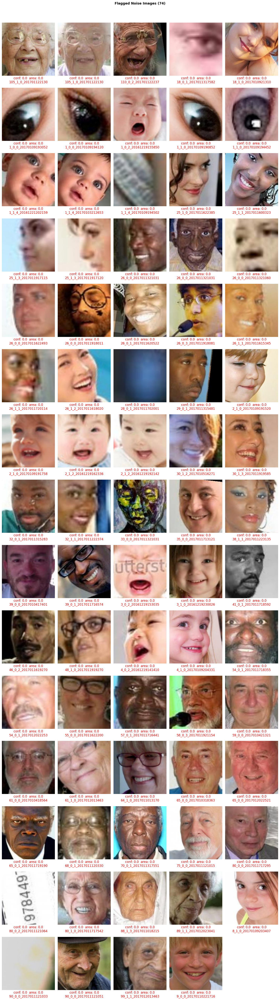

In [69]:
def plot_noise(noise_df, df, noise_mask, N=80, cols=5, fontsize=7):
    """
    Plot flagged noise images in a grid.

    Args:
        noise_df   : DataFrame of flagged noise images
        df         : Original DataFrame with images
        noise_mask : Boolean mask of noise images
        N          : Max images to plot
        cols       : Number of columns in grid
        fontsize   : Label font size
    """
    N    = min(N, len(noise_df))
    rows = N // cols + int(N % cols > 0)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.5))
    axes      = axes.flatten()

    for i, (_, r) in enumerate(noise_df.head(N).iterrows()):
        ax  = axes[i]
        img = df.iloc[r['df_index']]['image']
        ax.imshow(img)
        ax.set_xlabel(
            f"conf: {r['confidence']}  area: {r['face_area']}\n{r['filename'][:20]}",
            fontsize=fontsize, color='red', labelpad=3
        )
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Flagged Noise Images ({noise_mask.sum()})", fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

plot_noise(noise_df, df, noise_mask, N=80, cols=5, fontsize=12)

### Permissive Noise Penalty

In [50]:

haar_frontal = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_alt2.xml')
haar_profile = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_profileface.xml')
haar_default = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# ── Helpers ───────────────────────────────────────────────────────────────────
def enhance(img_pil):
    img = ImageEnhance.Contrast(img_pil).enhance(1.5)
    img = ImageEnhance.Sharpness(img).enhance(2.0)
    return img


def haar_detect(img_cv, w, h):
    for cascade in [haar_frontal, haar_default, haar_profile]:
        try:
            faces = cascade.detectMultiScale(
                img_cv, scaleFactor=1.03, minNeighbors=2, minSize=(15, 15)
            )
            if len(faces) > 0:
                x, y, fw, fh = max(faces, key=lambda f: f[2] * f[3])
                face_area    = (fw * fh) / (w * h)
                if face_area >= 0.03:
                    return True, round(face_area, 4)
        except Exception:
            pass
    return False, 0.0

def mtcnn_batch(batch_images, batch_indices, mtcnn_results, prob_threshold=0.40):
    try:
        boxes_batch, probs_batch = mtcnn.detect(batch_images)
    except Exception:
        return
    for j, (boxes, probs) in enumerate(zip(boxes_batch, probs_batch)):
        idx = batch_indices[j]
        try:
            if boxes is not None and len(boxes) > 0:
                best_idx  = np.argmax(probs)
                best_prob = float(probs[best_idx])
                best_box  = boxes[best_idx]
                bw        = best_box[2] - best_box[0]
                bh        = best_box[3] - best_box[1]
                face_area = (bw * bh) / (160 * 160)
                if best_prob >= prob_threshold and face_area >= 0.03:
                    mtcnn_results[idx] = (True, round(best_prob, 4), round(face_area, 4))
                    continue  
        except Exception:
            pass
        if idx not in mtcnn_results or not mtcnn_results[idx][0]:
            mtcnn_results[idx] = (False, 0.0, 0.0)

# ── Pass 1: MTCNN on original ─────────────────────────────────────────────────
print("MTCNN pass 1 (original)...")
BATCH_SIZE    = 64
mtcnn_results = {}

for i in tqdm(range(0, len(gray_images), BATCH_SIZE), desc="MTCNN pass 1"):
    batch_imgs = gray_images[i:i + BATCH_SIZE]
    batch_idx  = list(range(i, min(i + BATCH_SIZE, len(images))))
    mtcnn_batch(batch_imgs, batch_idx, mtcnn_results, prob_threshold=0.40)

failures = [idx for idx, (hf, _, _) in mtcnn_results.items() if not hf]
print(f"After pass 1: {len(mtcnn_results) - len(failures):,} clean, {len(failures):,} failures")

# ── Pass 2: MTCNN on enhanced images ─────────────────────────────────────────
print(f"MTCNN pass 2 (enhanced) on {len(failures)} failures...")
enhanced_images = {idx: preprocess(images[idx], enhanced=True) for idx in failures}

for i in tqdm(range(0, len(failures), BATCH_SIZE), desc="MTCNN pass 2"):
    batch_idx  = failures[i:i + BATCH_SIZE]
    batch_imgs = [enhanced_images[idx] for idx in batch_idx]
    mtcnn_batch(batch_imgs, batch_idx, mtcnn_results, prob_threshold=0.30)

failures = [idx for idx, (hf, _, _) in mtcnn_results.items() if not hf]
print(f"After pass 2: {len(mtcnn_results) - len(failures):,} clean, {len(failures):,} failures")

# ── Pass 3: Haar cascade ──────────────────────────────────────────────────────
print(f"Haar fallback on {len(failures)} failures...")
for idx in tqdm(failures, desc="Haar"):
    img_cv     = np.array(images[idx].convert('L'))
    w, h       = images[idx].size
    found, area = haar_detect(img_cv, w, h)
    if found:
        mtcnn_results[idx] = (True, 0.8, area)

failures = [idx for idx, (hf, _, _) in mtcnn_results.items() if not hf]
print(f"After Haar: {len(mtcnn_results) - len(failures):,} clean, {len(failures):,} failures")

# ── Pass 4: RetinaFace ────────────────────────────────────────────────────────
print(f"RetinaFace fallback on {len(failures)} failures...")
for idx in tqdm(failures, desc="RetinaFace"):
    try:
        img_np = np.array(images[idx].convert('RGB'))
        faces  = RetinaFace.detect_faces(img_np)
        if isinstance(faces, dict) and len(faces) > 0:
            best        = max(faces.values(), key=lambda f: f['score'])
            score       = best['score']
            x1, y1, x2, y2 = best['facial_area']
            w, h        = images[idx].size
            face_area   = ((x2 - x1) * (y2 - y1)) / (w * h)
            if score >= 0.8 and face_area >= 0.03:
                mtcnn_results[idx] = (True, round(score, 4), round(face_area, 4))
    except Exception:
        pass

failures = [idx for idx, (hf, _, _) in mtcnn_results.items() if not hf]
print(f"After RetinaFace: {len(mtcnn_results) - len(failures):,} clean, {len(failures):,} failures")

# ── Build results df ──────────────────────────────────────────────────────────
results = []
for idx in range(len(df)):
    has_face, conf, area = mtcnn_results.get(idx, (False, 0.0, 0.0))
    results.append({
        'df_index'  : idx,
        'filename'  : df.iloc[idx]['filename'],
        'age'       : df.iloc[idx]['age'],
        'gender'    : df.iloc[idx]['gender'],
        'race'      : df.iloc[idx]['race'],
        'has_face'  : has_face,
        'confidence': conf,
        'face_area' : area,
    })

detect_df_strict  = pd.DataFrame(results)


MTCNN pass 1 (original)...


MTCNN pass 1: 100%|██████████████████████████████████████████████████████████████████| 371/371 [03:04<00:00,  2.01it/s]


After pass 1: 23,597 clean, 108 failures
MTCNN pass 2 (enhanced) on 108 failures...


MTCNN pass 2: 100%|██████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.25it/s]


After pass 2: 23,635 clean, 70 failures
Haar fallback on 70 failures...


Haar: 100%|████████████████████████████████████████████████████████████████████████████| 70/70 [00:03<00:00, 19.41it/s]


After Haar: 23,682 clean, 23 failures
RetinaFace fallback on 23 failures...


RetinaFace: 100%|██████████████████████████████████████████████████████████████████████| 23/23 [03:41<00:00,  9.61s/it]


After RetinaFace: 23,682 clean, 23 failures


In [52]:
clean_df_strict, noise_df_strict, clean_mask, noise_mask = build_clean_df(df, detect_df_strict)

Total images : 23,705
Clean images : 23,682  (99.9%)
Noise images : 23  (0.1%)


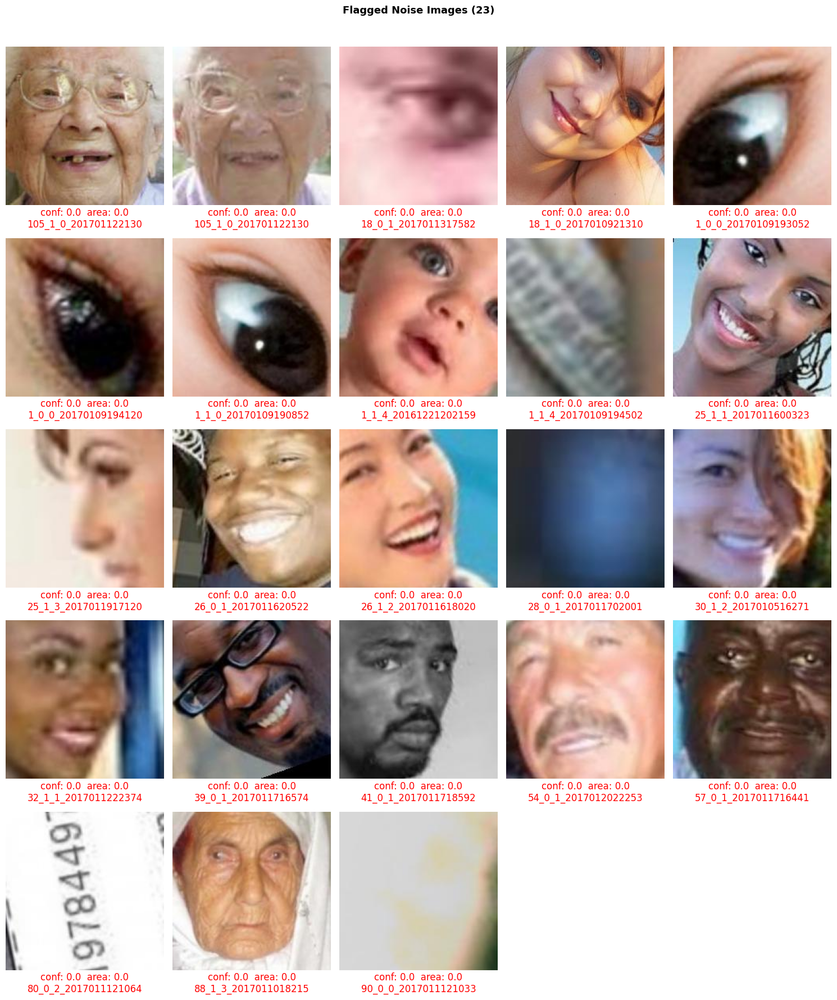

In [60]:
plot_noise(noise_df_strict, df, noise_mask, N=40, cols=5, fontsize=12)

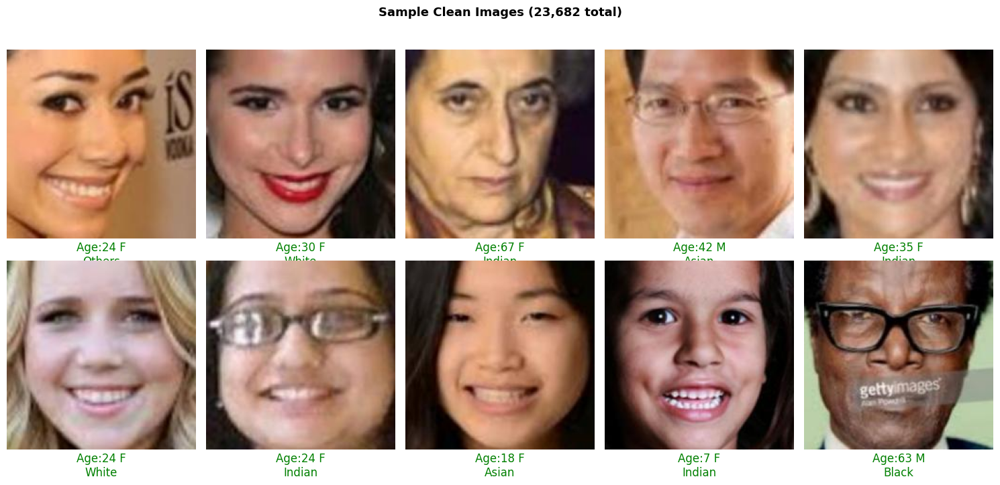

In [75]:
def plot_clean(df, N=80, cols=5, fontsize=12):
    """
    Plot a random sample of clean images.

    Args:
        clean_df  : Filtered DataFrame with clean images
        N         : Max images to plot
        cols      : Number of columns in grid
        fontsize  : Label font size
    """
    N      = min(N, len(df))
    sample = df.sample(N, random_state=SEED)
    rows   = N // cols + int(N % cols > 0)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.5))
    axes      = axes.flatten()

    for i, (_, r) in enumerate(sample.iterrows()):
        ax  = axes[i]
        ax.imshow(r['image'])
        ax.set_xlabel(
            f"Age:{r['age']} {'M' if r['gender']==0 else 'F'}\n"
            f"{['White','Black','Asian','Indian','Others'][r['race']]}",
            fontsize=fontsize, color='green', labelpad=12
        )
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Sample Clean Images ({len(df):,} total)", fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

# usage
plot_clean(clean_df_strict, N=10, cols=5)

### ResNet50 First Pass Age Detector

In [70]:
class FaceAgeDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df        = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row   = self.df.iloc[idx]
        image = row['image']
        age   = torch.tensor(row['age'], dtype=torch.float32)
        if self.transform:
            image = self.transform(image)
        return image, age

train_transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

infer_transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

dataset    = FaceAgeDataset(clean_df, transform=train_transform)
val_size   = int(0.1 * len(dataset))
train_size = len(dataset) - val_size
train_ds, val_ds = torch.utils.data.random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_ds, batch_size=128, shuffle=True,  num_workers=0, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=128, shuffle=False, num_workers=0, pin_memory=True)

class AgeRegressor(nn.Module):
    def __init__(self):
        super().__init__()
        backbone = models.resnet50(weights='IMAGENET1K_V1')
        # freeze up to layer2, unfreeze layer3, layer4, fc
        for name, param in backbone.named_parameters():
            if 'layer3' not in name and 'layer4' not in name and 'fc' not in name:
                param.requires_grad = False
        backbone.fc = nn.Sequential(
            nn.Linear(backbone.fc.in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 1)
        )
        self.model = backbone

    def forward(self, x):
        return self.model(x).squeeze(1)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Training on: {torch.cuda.get_device_name(0)}")
model  = AgeRegressor().to(device)

criterion  = nn.L1Loss()
optimizer  = optim.Adam([
    {'params': model.model.layer3.parameters(), 'lr': 1e-5},
    {'params': model.model.layer4.parameters(), 'lr': 1e-4},
    {'params': model.model.fc.parameters(),     'lr': 1e-3},
], weight_decay=1e-5)
scheduler  = CosineAnnealingLR(optimizer, T_max=30)
scaler     = GradScaler()
EPOCHS     = 30
best_val   = float('inf')
patience   = 10
no_improve = 0

for epoch in range(EPOCHS):
    # train
    model.train()
    train_loss = 0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Train]", leave=False)
    for images, ages in pbar:
        images, ages = images.to(device, non_blocking=True), ages.to(device, non_blocking=True)
        optimizer.zero_grad()
        with autocast():
            preds = model(images)
            loss  = criterion(preds, ages)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        train_loss += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.2f}")

    # validate
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for images, ages in tqdm(val_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Val]", leave=False):
            images, ages = images.to(device, non_blocking=True), ages.to(device, non_blocking=True)
            with autocast():
                preds = model(images)
            val_loss += criterion(preds, ages).item()

    scheduler.step()
    avg_train = train_loss / len(train_loader)
    avg_val   = val_loss   / len(val_loader)
    print(f"Epoch {epoch+1:>2}/{EPOCHS}  "
          f"train_mae: {avg_train:.2f}  "
          f"val_mae:   {avg_val:.2f}")

    # early stopping
    if avg_val < best_val:
        best_val   = avg_val
        no_improve = 0
        torch.save(model.state_dict(), 'best_model.pth')
        print(f"  ✓ saved best model  (val_mae: {best_val:.2f})")
    else:
        no_improve += 1
        print(f"  no improvement {no_improve}/{patience}")
        if no_improve >= patience:
            print("Early stopping triggered")
            break

# reload best weights
model.load_state_dict(torch.load('best_model.pth'))
print(f"\nBest val_mae: {best_val:.2f}")

AGE_THRESHOLD = 10
infer_ds = FaceAgeDataset(df, transform=infer_transform)
infer_loader = DataLoader(infer_ds, batch_size=256, shuffle=False, num_workers=0, pin_memory=True)

model.eval()
results = []
with torch.no_grad():
    for i, (images, ages) in enumerate(tqdm(infer_loader, desc="Inferring")):
        images = images.to(device, non_blocking=True)
        with autocast():
            preds = model(images).cpu().numpy()
        ages  = ages.numpy()
        start = i * infer_loader.batch_size
        for j, (pred, age) in enumerate(zip(preds, ages)):
            idx = start + j
            results.append({
                'df_index'   : idx,
                'filename'   : df.iloc[idx]['filename'],
                'labeled_age': int(age),
                'pred_age'   : round(float(pred), 1),
                'error'      : round(abs(float(pred) - float(age)), 1),
                'flagged'    : abs(float(pred) - float(age)) > AGE_THRESHOLD
            })

results_df = pd.DataFrame(results)
flagged_df = results_df[results_df['flagged']].sort_values('error', ascending=False)
print(f"\nFlagged misentries: {len(flagged_df)} / {len(df)}")
print(flagged_df.head(20).to_string())

Training on: NVIDIA GeForce RTX 4070 Laptop GPU


Epoch  1/30  train_mae: 10.73  val_mae:   8.24
  ✓ saved best model  (val_mae: 8.24)


Epoch  2/30  train_mae: 7.83  val_mae:   7.52
  ✓ saved best model  (val_mae: 7.52)


Epoch  3/30  train_mae: 7.40  val_mae:   7.06
  ✓ saved best model  (val_mae: 7.06)


Epoch  4/30  train_mae: 6.84  val_mae:   7.08
  no improvement 1/10


Epoch  5/30  train_mae: 6.62  val_mae:   6.99
  ✓ saved best model  (val_mae: 6.99)


Epoch  6/30  train_mae: 6.37  val_mae:   6.46
  ✓ saved best model  (val_mae: 6.46)


Epoch  7/30  train_mae: 6.18  val_mae:   6.47
  no improvement 1/10


Epoch  8/30  train_mae: 5.95  val_mae:   6.23
  ✓ saved best model  (val_mae: 6.23)


Epoch  9/30  train_mae: 5.87  val_mae:   6.30
  no improvement 1/10


Epoch 10/30  train_mae: 5.68  val_mae:   6.34
  no improvement 2/10


Epoch 11/30  train_mae: 5.59  val_mae:   6.44
  no improvement 3/10


Epoch 12/30  train_mae: 5.43  val_mae:   6.14
  ✓ saved best model  (val_mae: 6.14)


Epoch 13/30  train_mae: 5.25  val_mae:   6.07
  ✓ saved best model  (val_mae: 6.07)


Epoch 14/30  train_mae: 5.16  val_mae:   6.15
  no improvement 1/10


Epoch 15/30  train_mae: 5.08  val_mae:   6.03
  ✓ saved best model  (val_mae: 6.03)


Epoch 16/30  train_mae: 4.97  val_mae:   6.07
  no improvement 1/10


Epoch 17/30  train_mae: 4.86  val_mae:   5.98
  ✓ saved best model  (val_mae: 5.98)


Epoch 18/30  train_mae: 4.79  val_mae:   6.12
  no improvement 1/10


Epoch 19/30  train_mae: 4.62  val_mae:   6.23
  no improvement 2/10


Epoch 20/30  train_mae: 4.65  val_mae:   5.95
  ✓ saved best model  (val_mae: 5.95)


Epoch 21/30  train_mae: 4.49  val_mae:   5.94
  ✓ saved best model  (val_mae: 5.94)


Epoch 22/30  train_mae: 4.45  val_mae:   6.07
  no improvement 1/10


Epoch 23/30  train_mae: 4.36  val_mae:   6.04
  no improvement 2/10


Epoch 24/30  train_mae: 4.34  val_mae:   6.10
  no improvement 3/10


Epoch 25/30  train_mae: 4.29  val_mae:   6.06
  no improvement 4/10


Epoch 26/30  train_mae: 4.21  val_mae:   6.03
  no improvement 5/10


Epoch 27/30  train_mae: 4.23  val_mae:   5.92
  ✓ saved best model  (val_mae: 5.92)


Epoch 28/30  train_mae: 4.16  val_mae:   5.97
  no improvement 1/10


Epoch 29/30  train_mae: 4.16  val_mae:   5.90
  ✓ saved best model  (val_mae: 5.90)


Epoch 30/30  train_mae: 4.09  val_mae:   5.87
  ✓ saved best model  (val_mae: 5.87)

Best val_mae: 5.87


Inferring: 100%|███████████████████████████████████████████████████████████████████████| 93/93 [00:22<00:00,  4.08it/s]


Flagged misentries: 1289 / 23705
       df_index                                filename  labeled_age  pred_age  error  flagged
1806       1806    1_0_2_20161219161843718.jpg.chip.jpg            1      79.9   78.9     True
23408     23408   90_0_0_20170111210338948.jpg.chip.jpg           90      25.1   64.9     True
23055     23055   86_1_2_20170105174652949.jpg.chip.jpg           86      22.4   63.6     True
2343       2343    1_1_0_20170109194452834.jpg.chip.jpg            1      60.6   59.6     True
180         180  111_1_0_20170120134646399.jpg.chip.jpg          111      53.6   57.4     True
20189     20189    5_0_1_20170117193745507.jpg.chip.jpg            5      61.2   56.2     True
22701     22701   80_0_2_20170111210646563.jpg.chip.jpg           80      27.5   52.5     True
23183     23183    8_0_0_20170117182551223.jpg.chip.jpg            8      59.2   51.2     True
2683       2683    1_1_4_20170109194502921.jpg.chip.jpg            1      45.1   44.1     True
22750     22750 

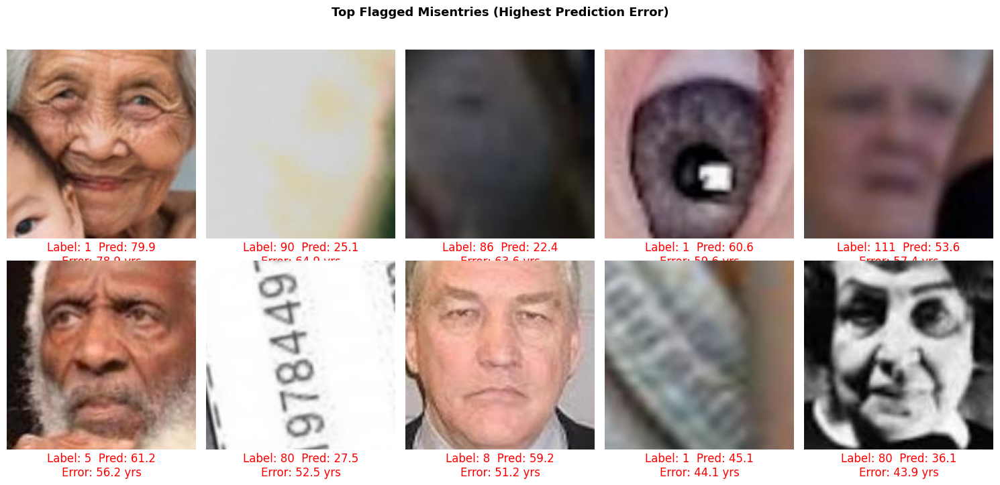

In [74]:
N         = 10
sample_df = flagged_df.head(N)
cols      = 5
rows      = N // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.5))

for i, (_, r) in enumerate(sample_df.iterrows()):
    ax  = axes[i // cols, i % cols]
    img = df.iloc[r['df_index']]['image']
    ax.imshow(img)
    ax.set_xlabel(
        f"Label: {r['labeled_age']}  Pred: {r['pred_age']}\n"
        f"Error: {r['error']} yrs",
        fontsize=12, color='red', labelpad=3
    )
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

plt.suptitle("Top Flagged Misentries (Highest Prediction Error)", fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

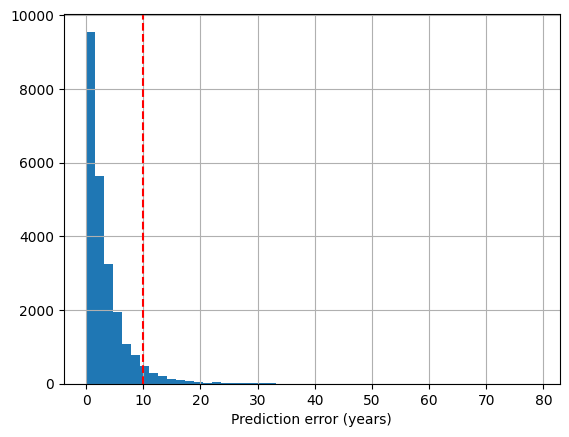

In [72]:
results_df['error'].hist(bins=50)
plt.axvline(AGE_THRESHOLD, color='red', linestyle='--', label='threshold')
plt.xlabel('Prediction error (years)')
plt.show()

### Dataset 

In [ ]:
class DFDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row    = self.df.iloc[idx]
        img    = row['image']
        age    = row['age']
        gender = row['gender']
        race   = row['race']

        if self.transform:
            img = self.transform(img)

        return img, age, gender, race

transform = transforms.Compose([
    transforms.ToTensor(),
])

clean_dataset = DFDataset(df, transform=transform)

print(f"Clean dataset size: {len(clean_dataset):,} images")
print(f"Sample: {clean_dataset[0][0].shape}, age={clean_dataset[0][1]}, gender={clean_dataset[0][2]}, race={clean_dataset[0][3]}")

## Unsupervised Learning Methods

### PCA

In [63]:
age_bins = pd.cut(df['age'], bins=[0, 18, 35, 50, 65, 120], labels=[0, 1, 2, 3, 4])
stratify_key = age_bins.astype(str) + '_' + df['gender'].astype(str) + '_' + df['race'].astype(str)

# Split indices
eda_idx, holdout_idx = train_test_split(
    np.arange(len(df)),
    test_size=0.76,
    train_size=0.24,
    random_state=1090,
    stratify=stratify_key
)

eda_df      = df.iloc[eda_idx].reset_index(drop=True)
holdout_df  = df.iloc[holdout_idx].reset_index(drop=True)

print(f"EDA set     : {len(eda_df):,} images")
print(f"Holdout set : {len(holdout_df):,} images")

# Verify stratification
print("\nGender distribution (EDA):")
print(eda_df['gender'].value_counts(normalize=True).round(3))

print("\nGender distribution (Holdout):")
print(holdout_df['gender'].value_counts(normalize=True).round(3))

EDA set     : 5,595 images
Holdout set : 17,720 images

Gender distribution (EDA):
gender
0    0.523
1    0.477
Name: proportion, dtype: float64

Gender distribution (Holdout):
gender
0    0.523
1    0.477
Name: proportion, dtype: float64


In [66]:
i_sz = (64, 64)

vectors = np.array([
    np.array(row['image'].resize(i_sz)).flatten()
    for _, row in eda_df.iterrows()
], dtype=np.float32)

print(f"Vectors shape: {vectors.shape}")
print(f"Memory usage : {vectors.nbytes / 1e6:.1f} MB")

pca = PCA(n_components=2)
pca.fit(vectors)
vectors_pca = pca.transform(vectors)

def plot_pca(vectors_pca, df, color_by='age'):
    fig, ax = plt.subplots(figsize=(10, 8))

    if color_by == 'age':
        c      = df['age']
        label  = 'Age'
        cmap   = 'viridis'
    elif color_by == 'gender':
        c      = df['gender']
        label  = 'Gender (0=M, 1=F)'
        cmap   = 'coolwarm'
    elif color_by == 'race':
        c      = df['race']
        label  = 'Race'
        cmap   = 'tab10'

    sc = ax.scatter(vectors_pca[:, 0], vectors_pca[:, 1],
                    c=c, cmap=cmap, alpha=0.4, s=10)
    plt.colorbar(sc, ax=ax, label=label)
    ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
    ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
    ax.set_title(f"PCA — colored by {color_by}")
    ax.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"Variance Explained by PC1: {pca.explained_variance_ratio_[0]:.2%}")
    print(f"Variance Explained by PC2: {pca.explained_variance_ratio_[1]:.2%}")

plot_pca(vectors_pca, eda_df, color_by='age')
plot_pca(vectors_pca, eda_df, color_by='gender')
plot_pca(vectors_pca, eda_df, color_by='race')

NameError: name 'eda_df' is not defined

In [ ]:
def sample_img_plt(vectors, df, size):
    knn = NearestNeighbors(n_neighbors=24, metric='euclidean')
    knn.fit(vectors)
    
    np.random.seed(1090)
    sample_indices = np.random.choice(len(vectors), size=size, replace=False)
    
    for idx in sample_indices:
        sample = vectors[idx].reshape(1, -1)
        distances, neighbor_indices = knn.kneighbors(sample)
        all_indices = neighbor_indices[0]

        fig, axes = plt.subplots(3, 8, figsize=(16, 8))
        axes = axes.ravel()

        for plot_i, dataset_idx in enumerate(all_indices):
            row = df.iloc[dataset_idx]
            axes[plot_i].imshow(row['image'])

            gender = 'M' if row['gender'] == 0 else 'F'
            race_map = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}

            if plot_i == 0:
                axes[plot_i].set_title(
                    f"QUERY\nAge:{row['age']} {gender}\n{race_map[row['race']]}",
                    fontsize=7, color='red'
                )
            else:
                axes[plot_i].set_title(
                    f"d={distances[0][plot_i]:.1f}\nAge:{row['age']} {gender}\n{race_map[row['race']]}",
                    fontsize=7
                )
            axes[plot_i].axis('off')

        plt.suptitle(f"Query Image #{idx} — 23 Nearest Neighbors in PCA Space", fontsize=13)
        plt.tight_layout()
        plt.show()

sample_img_plt(vectors_pca, eda_df, size=3)

### UMAP

In [66]:
def sample_img_plt_umap(vectors, df, embedding_2d, cluster_labels, size=3):
    knn = NearestNeighbors(n_neighbors=24, metric='euclidean')
    knn.fit(vectors)

    race_map   = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}
    colors     = plt.cm.tab10(np.linspace(0, 1, len(np.unique(cluster_labels))))

    np.random.seed(1090)
    sample_indices = np.random.choice(len(vectors), size=size, replace=False)

    for idx in sample_indices:
        sample = vectors[idx].reshape(1, -1)
        distances, neighbor_indices = knn.kneighbors(sample)
        all_indices = neighbor_indices[0]

        fig = plt.figure(figsize=(18, 10))

        ax_umap = fig.add_subplot(1, 2, 1)
        ax_umap.scatter(
            embedding_2d[:, 0], embedding_2d[:, 1],
            c=cluster_labels, cmap='tab10',
            s=2, alpha=0.3, label='all points'
        )
        
        ax_umap.scatter(
            embedding_2d[all_indices, 0], embedding_2d[all_indices, 1],
            s=40, color='yellow', zorder=3, label='neighbors'
        )

        ax_umap.scatter(
            embedding_2d[idx, 0], embedding_2d[idx, 1],
            s=120, color='red', zorder=4, marker='*', label='query'
        )
        ax_umap.set_title(f"UMAP — Query #{idx} (cluster {cluster_labels[idx]})", fontsize=11)
        ax_umap.set_xlabel("UMAP-1")
        ax_umap.set_ylabel("UMAP-2")
        ax_umap.legend(fontsize=8)
        ax_umap.grid(True, linestyle='--', alpha=0.3)

        inner_grid = fig.add_subplot(1, 2, 2)
        inner_grid.axis('off')

        sub_axes = fig.add_gridspec(3, 8, left=0.5, right=0.98, hspace=0.5, wspace=0.3)

        for plot_i, dataset_idx in enumerate(all_indices):
            row    = df.iloc[dataset_idx]
            gender = 'M' if row['gender'] == 0 else 'F'
            ax_img = fig.add_subplot(sub_axes[plot_i // 8, plot_i % 8])
            ax_img.imshow(row['image'])
            cluster_color = colors[cluster_labels[dataset_idx]]

            if plot_i == 0:
                ax_img.set_title(
                    f"QUERY\nAge:{row['age']} {gender}\n{race_map[row['race']]}\nC={cluster_labels[dataset_idx]}",
                    fontsize=6, color='red'
                )
                for spine in ax_img.spines.values():
                    spine.set_edgecolor('red')
                    spine.set_linewidth(2)
            else:
                ax_img.set_title(
                    f"d={distances[0][plot_i]:.1f}\nAge:{row['age']} {gender}\n{race_map[row['race']]}\nC={cluster_labels[dataset_idx]}",
                    fontsize=6
                )
                for spine in ax_img.spines.values():
                    spine.set_edgecolor(cluster_color)
                    spine.set_linewidth(2)
            ax_img.axis('off')

        plt.suptitle(
            f"Query #{idx} — Cluster {cluster_labels[idx]} — 23 Nearest Neighbors in UMAP Space",
            fontsize=13
        )
        plt.show()

In [ ]:
import sys
def progressbar(n_step, n_total):
    n_step = n_step + 1
    barlen = 50
    progress = n_step / n_total
    block = int(round(barlen * progress))
    status = ""
    if n_step == n_total:
        status = "Done...\r\n\n"
    text = "\r [{0}] {1}/{2} {3}".format(
        "=" * block + "-" * (barlen - block),
        n_step,
        n_total,
        status,
    )
    sys.stdout.write(text)
    sys.stdout.flush()

def plot_umap(ax, dataset, n_neighbors):
    ax.scatter(dataset[:, 0], dataset[:, 1], 
               c=np.arange(len(dataset)), cmap="viridis", alpha=0.5, s=2)
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(f'n_neighbors={n_neighbors}', fontsize=8)
    ax.grid(True, linestyle='--', alpha=0.3)

n_neighbors_range = [5, 10, 15, 20, 30, 50, 75, 100]
n                 = len(n_neighbors_range)
n_cols            = 4
n_rows            = int(np.ceil(n / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axes      = axes.ravel()

for i, n_neighbors in enumerate(n_neighbors_range):
    progressbar(i, n)
    umap_model   = UMAP(n_components=2, n_neighbors=n_neighbors, 
                        min_dist=0.01, random_state=1090)
    vectors_umap = umap_model.fit_transform(vectors_pca)
    plot_umap(axes[i], vectors_umap, n_neighbors)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle("UMAP Hyperparameter Optimization (n_neighbors)", fontsize=18)
plt.tight_layout()
plt.show()

In [ ]:
# --- Single UMAP with chosen settings ---
umap_model_1   = UMAP(n_components=2, n_neighbors=8, min_dist=0.05, random_state=1090)
embedding_1    = umap_model_1.fit_transform(vectors_pca)

sample_img_plt_umap(vectors_pca, df, embedding_1, cluster_labels, size=3)

### UMAP + KMEANS using PCA embbeddings

In [ ]:
KMEANS_N_INIT = 10
N_NEIGHBORS   = [15, 50, 100, 150]
MIN_DIST      = [0.1, 0.2, 0.5, 0.99]
N_COMPONENTS  = [2, 15, 50]
K_VALUES      = [5, 6, 7, 8, 9, 10]
RANDOM_STATE  = 1090

total = len(N_NEIGHBORS) * len(MIN_DIST) * len(N_COMPONENTS)
print(f"Total UMAP fits: {total} | Total KMeans fits: {total * len(K_VALUES)}")

results = []
for n_neighbors in N_NEIGHBORS:
    for min_dist in MIN_DIST:
        for n_components in N_COMPONENTS:
            umap_model = UMAP(
                n_components=n_components,
                n_neighbors=n_neighbors,
                min_dist=min_dist,
                random_state=RANDOM_STATE
            )
            embedding = umap_model.fit_transform(vectors_pca)

            for k in K_VALUES:
                kmeans = KMeans(n_clusters=k, n_init=KMEANS_N_INIT, random_state=RANDOM_STATE)
                cluster_labels = kmeans.fit_predict(embedding)
                score = silhouette_score(embedding, cluster_labels)
                results.append({
                    "n_neighbors"     : n_neighbors,
                    "min_dist"        : min_dist,
                    "n_components"    : n_components,
                    "k"               : k,
                    "silhouette_score": score,
                    "embedding"       : embedding,       
                    "cluster_labels"  : cluster_labels,
                })

results_df = pd.DataFrame(results)
results_df = results_df.sort_values("silhouette_score", ascending=False).reset_index(drop=True)

print("\nTop 15 Configurations by Silhouette Score:")
display(results_df.drop(columns=["embedding", "cluster_labels"]).head(15))

best        = results_df.iloc[0]
best_embed  = best["embedding"]
best_labels = best["cluster_labels"]

if best["n_components"] == 2:
    fig, ax = plt.subplots(figsize=(10, 7))
    scatter = ax.scatter(
        best_embed[:, 0], best_embed[:, 1],
        c=best_labels,
        cmap='tab10',
        s=2,
        alpha=0.6
    )
    plt.colorbar(scatter, ax=ax, label='Cluster')
    ax.set_title(
        f"UMAP Clusters (k={int(best['k'])}, "
        f"n_neighbors={int(best['n_neighbors'])}, "
        f"min_dist={best['min_dist']:.2f})\n"
        f"Silhouette Score: {best['silhouette_score']:.4f}",
        fontsize=12
    )
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")
    plt.tight_layout()
    plt.show()
else:
    
    print(f"Best config has n_components={int(best['n_components'])}, refitting with 2D for visualization...")
    umap_2d = UMAP(
        n_components=2,
        n_neighbors=int(best["n_neighbors"]),
        min_dist=best["min_dist"],
        random_state=RANDOM_STATE
    )
    embed_2d = umap_2d.fit_transform(vectors_pca)

    fig, ax = plt.subplots(figsize=(10, 7))
    scatter = ax.scatter(
        embed_2d[:, 0], embed_2d[:, 1],
        c=best_labels,
        cmap='tab10',
        s=2,
        alpha=0.6
    )
    
    plt.colorbar(scatter, ax=ax, label='Cluster')
    ax.set_title(
        f"UMAP 2D Projection — Best Config (k={int(best['k'])}, "
        f"n_neighbors={int(best['n_neighbors'])}, "
        f"min_dist={best['min_dist']:.2f})\n"
        f"Silhouette Score: {best['silhouette_score']:.4f}",
        fontsize=12
    )
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")
    plt.tight_layout()
    plt.show()

In [ ]:
best          = results_df.iloc[0]
best_labels   = best['cluster_labels']

if best['n_components'] == 2:
    best_embed_2d = best['embedding']
else:
    umap_2d = UMAP(
        n_components=2,
        n_neighbors=int(best['n_neighbors']),
        min_dist=best['min_dist'],
        random_state=1090
    )
    best_embed_2d = umap_2d.fit_transform(vectors_pca)

sample_img_plt_umap(vectors_pca, eda_df, best_embed_2d, best_labels, size=3)

In [ ]:
# --- Settings ---
RANDOM_STATE  = 1090
UMAP_SETTINGS = {
    "n_components": 2,
    "n_neighbors" : 8,
    "min_dist"    : 0.05,
    "random_state": RANDOM_STATE
}
K             = 5
KMEANS_N_INIT = 10

# --- UMAP ---
print("Fitting UMAP...")
umap_model_2   = UMAP(**UMAP_SETTINGS)
embedding    = umap_model_2.fit_transform(vectors_pca)
print(f"Embedding shape: {embedding.shape}")

# --- KMeans ---
print("Fitting KMeans...")
kmeans         = KMeans(n_clusters=K, n_init=KMEANS_N_INIT, random_state=RANDOM_STATE)
cluster_labels = kmeans.fit_predict(embedding)
score          = silhouette_score(embedding, cluster_labels)
print(f"Silhouette Score: {score:.4f}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 7))
scatter = ax.scatter(
    embedding[:, 0], embedding[:, 1],
    c=cluster_labels,
    cmap='tab10',
    s=2,
    alpha=0.6
)
plt.colorbar(scatter, ax=ax, label='Cluster')
ax.set_title(
    f"UMAP Clusters (k={K}, "
    f"n_neighbors={UMAP_SETTINGS['n_neighbors']}, "
    f"min_dist={UMAP_SETTINGS['min_dist']})\n"
    f"Silhouette Score: {score:.4f}",
    fontsize=12
)
ax.set_xlabel("UMAP-1")
ax.set_ylabel("UMAP-2")
plt.tight_layout()
plt.show()

In [ ]:
# --- Settings ---
RANDOM_STATE  = 1090
UMAP_SETTINGS = {
    "n_components": 2,
    "n_neighbors" : 8,
    "min_dist"    : 0.05,
    "random_state": RANDOM_STATE
}
K             = 5
KMEANS_N_INIT = 10

# --- UMAP ---
print("Fitting UMAP...")
umap_model_2   = UMAP(**UMAP_SETTINGS)
embedding    = umap_model_2.fit_transform(vectors_pca)
print(f"Embedding shape: {embedding.shape}")

# --- KMeans ---
print("Fitting KMeans...")
kmeans         = KMeans(n_clusters=K, n_init=KMEANS_N_INIT, random_state=RANDOM_STATE)
cluster_labels = kmeans.fit_predict(embedding)
score          = silhouette_score(embedding, cluster_labels)
print(f"Silhouette Score: {score:.4f}")

# --- Cluster Plot ---
fig, ax = plt.subplots(figsize=(10, 7))
scatter = ax.scatter(
    embedding[:, 0], embedding[:, 1],
    c=cluster_labels,
    cmap='tab10',
    s=2,
    alpha=0.6
)
plt.colorbar(scatter, ax=ax, label='Cluster')
ax.set_title(
    f"UMAP Clusters (k={K}, "
    f"n_neighbors={UMAP_SETTINGS['n_neighbors']}, "
    f"min_dist={UMAP_SETTINGS['min_dist']})\n"
    f"Silhouette Score: {score:.4f}",
    fontsize=12
)
ax.set_xlabel("UMAP-1")
ax.set_ylabel("UMAP-2")
plt.tight_layout()
plt.show()

# --- KNN Image Plot ---
def sample_img_plt_umap(vectors, df, embedding_2d, cluster_labels, size=3):
    knn = NearestNeighbors(n_neighbors=24, metric='euclidean')
    knn.fit(vectors)

    race_map = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}
    colors   = plt.cm.tab10(np.linspace(0, 1, len(np.unique(cluster_labels))))

    np.random.seed(RANDOM_STATE)
    sample_indices = np.random.choice(len(vectors), size=size, replace=False)

    for idx in sample_indices:
        sample = vectors[idx].reshape(1, -1)
        distances, neighbor_indices = knn.kneighbors(sample)
        all_indices = neighbor_indices[0]

        fig = plt.figure(figsize=(18, 10))

        # --- Left: UMAP plot ---
        ax_umap = fig.add_subplot(1, 2, 1)
        ax_umap.scatter(
            embedding_2d[:, 0], embedding_2d[:, 1],
            c=cluster_labels, cmap='tab10',
            s=2, alpha=0.3, label='all points'
        )
        ax_umap.scatter(
            embedding_2d[all_indices, 0], embedding_2d[all_indices, 1],
            s=40, color='yellow', zorder=3, label='neighbors'
        )
        ax_umap.scatter(
            embedding_2d[idx, 0], embedding_2d[idx, 1],
            s=120, color='red', zorder=4, marker='*', label='query'
        )
        ax_umap.set_title(f"UMAP — Query #{idx} (cluster {cluster_labels[idx]})", fontsize=11)
        ax_umap.set_xlabel("UMAP-1")
        ax_umap.set_ylabel("UMAP-2")
        ax_umap.legend(fontsize=8)
        ax_umap.grid(True, linestyle='--', alpha=0.3)

        # --- Right: image grid ---
        inner_grid = fig.add_subplot(1, 2, 2)
        inner_grid.axis('off')
        sub_axes = fig.add_gridspec(3, 8, left=0.5, right=0.98, hspace=0.5, wspace=0.3)

        for plot_i, dataset_idx in enumerate(all_indices):
            row           = df.iloc[dataset_idx]
            gender        = 'M' if row['gender'] == 0 else 'F'
            ax_img        = fig.add_subplot(sub_axes[plot_i // 8, plot_i % 8])
            cluster_color = colors[cluster_labels[dataset_idx]]

            ax_img.imshow(row['image'])

            if plot_i == 0:
                ax_img.set_title(
                    f"QUERY\nAge:{row['age']} {gender}\n"
                    f"{race_map[row['race']]}\nC={cluster_labels[dataset_idx]}",
                    fontsize=6, color='red'
                )
                for spine in ax_img.spines.values():
                    spine.set_edgecolor('red')
                    spine.set_linewidth(2)
            else:
                ax_img.set_title(
                    f"d={distances[0][plot_i]:.1f}\nAge:{row['age']} {gender}\n"
                    f"{race_map[row['race']]}\nC={cluster_labels[dataset_idx]}",
                    fontsize=6
                )
                for spine in ax_img.spines.values():
                    spine.set_edgecolor(cluster_color)
                    spine.set_linewidth(2)
            ax_img.axis('off')

        plt.suptitle(
            f"Query #{idx} — Cluster {cluster_labels[idx]} — "
            f"23 Nearest Neighbors in UMAP Space",
            fontsize=13
        )
        plt.show()

sample_img_plt_umap(vectors_pca, df, embedding, cluster_labels, size=3)

## Initial ResNet Training

### Train val test split

Stratifying the split to allow for subgroup fairness (addressing the issues seen in EDA).

Because some fine-grained age × race × gender subgroups contained too few samples for reliable stratified splitting, we stratified by race and gender only, while reserving age bins for downstream fairness evaluation.

Ages are binned to specifically look at the effect of fewer images of teens.

In [ ]:
labels = ["0_5",      # infants / toddlers
          "5_13",     # children
          "13_20",    # teens
          "21_40",
          "41_60",
          "61_80",
          "80_plus"
]

df["eval_age_bin"] = pd.cut(
    df["age"],
    bins = [0, 5, 13, 20, 40, 60, 80, 120],
    labels = labels,
    include_lowest=True
)

# simple stratification key
df["stratify_key"] = (
    df["race_label"].astype(str) + "_" +
    df["gender_label"].astype(str) + "_"
)

# remove very tiny groups if stratification breaks
valid_keys = df["stratify_key"].value_counts()
valid_keys = valid_keys[valid_keys >= 2].index
df_split = df[df["stratify_key"].isin(valid_keys)].copy()

train_df, temp_df = train_test_split(
    df_split,
    test_size=0.30,
    random_state=42,
    stratify=df_split["stratify_key"]
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=42,
    stratify=temp_df["stratify_key"]
)

print(f"Train size: {len(train_df)}")
print(f"Validation size: {len(val_df)}")
print(f"Test size: {len(test_df)}")

### First Pass ResNet CNN

In [ ]:
class UTKFaceDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        image = Image.open(row["filepath"]).convert("RGB")

        if self.transform:
            image = self.transform(image)

        age = torch.tensor(row["age"], dtype=torch.float32)
        gender = torch.tensor(row["gender"], dtype=torch.float32)

        # keep subgroup info for later fairness analysis
        race = row["race_label"]
        age_bin = row["eval_age_bin"]

        return image, age, gender, race, age_bin

In [ ]:
from torchvision import transforms

IMG_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

# dataloaders
train_dataset = UTKFaceDataset(train_df, transform=train_transform)
val_dataset = UTKFaceDataset(val_df, transform=val_transform)
test_dataset = UTKFaceDataset(test_df, transform=test_transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


class MultiTaskResNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.backbone = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()

        self.age_head = nn.Linear(in_features, 1)
        self.gender_head = nn.Linear(in_features, 1)

    def forward(self, x):
        features = self.backbone(x)

        age_pred = self.age_head(features).squeeze(1)         # shape: [batch]
        gender_logit = self.gender_head(features).squeeze(1)  # shape: [batch]

        return age_pred, gender_logit

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

resnet_model = MultiTaskResNet().to(device)

age_criterion = nn.L1Loss()  # MAE-like loss for age
gender_criterion = nn.BCEWithLogitsLoss()

optimizer = torch.optim.Adam(resnet_model.parameters(), lr=1e-4)

def train_one_epoch(model, loader, optimizer, age_criterion, gender_criterion, device):
    model.train()

    total_loss = 0.0
    total_age_loss = 0.0
    total_gender_loss = 0.0

    for images, ages, genders, _, _ in loader:
        images = images.to(device)
        ages = ages.to(device)
        genders = genders.to(device)

        optimizer.zero_grad()

        age_pred, gender_logit = model(images)

        age_loss = age_criterion(age_pred, ages)
        gender_loss = gender_criterion(gender_logit, genders)

        loss = age_loss + gender_loss
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * images.size(0)
        total_age_loss += age_loss.item() * images.size(0)
        total_gender_loss += gender_loss.item() * images.size(0)

    n = len(loader.dataset)

    return {
        "loss": total_loss / n,
        "age_loss": total_age_loss / n,
        "gender_loss": total_gender_loss / n
    }

def evaluate(model, loader, age_criterion, gender_criterion, device):
    model.eval()

    total_loss = 0.0
    total_age_loss = 0.0
    total_gender_loss = 0.0

    all_age_preds = []
    all_ages = []
    all_gender_probs = []
    all_genders = []

    with torch.no_grad():
        for images, ages, genders, _, _ in loader:
            images = images.to(device)
            ages = ages.to(device)
            genders = genders.to(device)

            age_pred, gender_logit = model(images)

            age_loss = age_criterion(age_pred, ages)
            gender_loss = gender_criterion(gender_logit, genders)
            loss = age_loss + gender_loss

            total_loss += loss.item() * images.size(0)
            total_age_loss += age_loss.item() * images.size(0)
            total_gender_loss += gender_loss.item() * images.size(0)

            gender_probs = torch.sigmoid(gender_logit)
            gender_preds = (gender_probs >= 0.5).float()

            all_age_preds.append(age_pred.cpu())
            all_ages.append(ages.cpu())
            all_gender_probs.append(gender_preds.cpu())
            all_genders.append(genders.cpu())

    all_age_preds = torch.cat(all_age_preds)
    all_ages = torch.cat(all_ages)
    all_gender_preds = torch.cat(all_gender_probs)
    all_genders = torch.cat(all_genders)

    # age mean absolute error for age prediction
    age_mae = torch.mean(torch.abs(all_age_preds - all_ages)).item()
    gender_acc = (all_gender_preds == all_genders).float().mean().item()

    n = len(loader.dataset)

    return {
        "loss": total_loss / n,
        "age_loss": total_age_loss / n,
        "gender_loss": total_gender_loss / n,
        "age_mae": age_mae,
        "gender_acc": gender_acc
    }

In [ ]:
num_epochs = 10

history = {
    "train_loss": [],
    "val_loss": [],
    "val_age_mae": [],
    "val_gender_acc": []
}

best_val_mae = float("inf")

start_time = time.time()

for epoch in range(num_epochs):
    train_metrics = train_one_epoch(
        resnet_model, train_loader, optimizer,
        age_criterion, gender_criterion, device
    )

    val_metrics = evaluate(
        resnet_model, val_loader,
        age_criterion, gender_criterion, device
    )

    history["train_loss"].append(train_metrics["loss"])
    history["val_loss"].append(val_metrics["loss"])
    history["val_age_mae"].append(val_metrics["age_mae"])
    history["val_gender_acc"].append(val_metrics["gender_acc"])

    print(f"Epoch {epoch+1:02d} | "
          f"Train Loss: {train_metrics['loss']:.4f} | "
          f"Val Loss: {val_metrics['loss']:.4f} | "
          f"Age MAE: {val_metrics['age_mae']:.2f} | "
          f"Gender Acc: {val_metrics['gender_acc']:.3f}")

    if (val_metrics["age_mae"] < best_val_mae or
        (abs(val_metrics["age_mae"] - best_val_mae) < 1e-4 and
        val_metrics["gender_acc"] > best_gender_acc)):
    
        best_val_mae = val_metrics["age_mae"]
        best_gender_acc = val_metrics["gender_acc"]
        torch.save(resnet_model.state_dict(), "best_resnet.pt")
        print("  → Saved new best model")

end_time = time.time()

total_time = end_time - start_time
print(f"\nTotal training time: {total_time:.2f} seconds ({total_time/60:.2f} minutes)")

In [ ]:
plt.figure()
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Val Loss")
plt.legend()
plt.title("Loss Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

plt.figure()
plt.plot(history["val_age_mae"], label="Val Age MAE")
plt.title("Age MAE Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("MAE (years)")
plt.show()

plt.figure()
plt.plot(history["val_gender_acc"], label="Val Gender Acc")
plt.title("Gender Accuracy Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.show()

We observe an elbow in loss at epoch 2 (quite early). Age MAE plateaus around 2, also relatively soon in the training. However, gender continues to improve as we train more epochs.

In [ ]:
def get_test_predictions(model, loader, device):
    model.eval()

    results = []

    with torch.no_grad():
        for images, ages, genders, races, age_bins in loader:
            images = images.to(device)

            age_pred, gender_logit = model(images)
            gender_prob = torch.sigmoid(gender_logit)
            gender_pred = (gender_prob >= 0.5).float()

            for i in range(len(images)):
                results.append({
                    "true_age": ages[i].item(),
                    "pred_age": age_pred[i].item(),
                    "age_error": age_pred[i].item() - ages[i].item(),
                    "true_gender": int(genders[i].item()),
                    "pred_gender": int(gender_pred[i].item()),
                    "gender_correct": int(gender_pred[i].item() == genders[i].item()),
                    "race_label": races[i],
                    "eval_age_bin": str(age_bins[i])
                })

    return pd.DataFrame(results)

In [ ]:
test_results = get_test_predictions(resnet_model, test_loader, device)

In [ ]:
age_mae_by_group = (
    test_results
    .groupby(["eval_age_bin", "race_label"])["age_error"]
    .apply(lambda x: x.abs().mean())
    .reset_index(name="age_mae")
)

plt.figure(figsize=(10, 6))
sns.lineplot(
    data=age_mae_by_group,
    x="eval_age_bin",
    y="age_mae",
    hue="race_label",
    marker="o"
)
plt.title("Age MAE Across Age Bins by Race")
plt.xlabel("Age Bin")
plt.ylabel("Age MAE (years)")
plt.legend(title="Race")
plt.show()

In [ ]:
gender_acc_by_group = (
    test_results
    .groupby(["eval_age_bin", "race_label"])["gender_correct"]
    .mean()
    .reset_index(name="gender_accuracy")
)

plt.figure(figsize=(10, 6))
sns.lineplot(
    data=gender_acc_by_group,
    x="eval_age_bin",
    y="gender_accuracy",
    hue="race_label",
    marker="o"
)
plt.title("Gender Accuracy Across Age Bins by Race")
plt.xlabel("Age Bin")
plt.ylabel("Gender Accuracy")
plt.ylim(0, 1.14)
plt.legend(title="Race")
plt.show()

In [ ]:
signed_error_by_group = (
    test_results
    .groupby(["eval_age_bin", "race_label"])["age_error"]
    .mean()
    .reset_index(name="mean_signed_error")
)

plt.figure(figsize=(10, 6))

sns.lineplot(
    data=signed_error_by_group,
    x="eval_age_bin",
    y="mean_signed_error",
    hue="race_label",
    marker="o"
)

plt.axhline(0, linestyle="--", color="black")
plt.title("Signed Age Error Across Age Bins by Race")
plt.xlabel("Age Bin")
plt.ylabel("Mean Signed Error (Predicted - True Age)")
plt.legend(title="Race")

plt.show()

In [ ]:
age_mae_pivot = age_mae_by_group.pivot(
    index="race_label",
    columns="eval_age_bin",
    values="age_mae"
)

plt.figure(figsize=(10, 5))
sns.heatmap(age_mae_pivot, annot=True, fmt=".2f", cmap="Reds")
plt.title("Age MAE by Race and Age Bin")
plt.xlabel("Age Bin")
plt.ylabel("Race")
plt.show()

In [ ]:
gender_acc_pivot = gender_acc_by_group.pivot(
    index="race_label",
    columns="eval_age_bin",
    values="gender_accuracy"
)

plt.figure(figsize=(10, 5))
sns.heatmap(gender_acc_pivot, annot=True, fmt=".3f", cmap="Blues", vmin=0, vmax=1)
plt.title("Gender Accuracy by Race and Age Bin")
plt.xlabel("Age Bin")
plt.ylabel("Race")
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=test_results, x="race_label", y="age_error")
plt.axhline(0, linestyle="--")
plt.title("Distribution of Age Errors by Race")
plt.xlabel("Race")
plt.ylabel("Predicted Age - True Age")
plt.show()

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=test_results, 
            x="eval_age_bin", 
            y="age_error", 
            hue="race_label", 
            order=labels)
plt.axhline(0, linestyle="--")
plt.title("Age Error Distribution by Age Bin and Race")
plt.xlabel("Age Bin")
plt.ylabel("Predicted Age - True Age")
plt.show()

- As age increases, MAE increases.
- Age MAE between races grows in a similar pattern with all of the major race groups and is much more sporadic for the "other" category.
- The model tends to predict younger for all categories above 20.

First Pass EfficientNet CNN

In [ ]:
class MultiTaskEfficientNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.backbone = models.efficientnet_b0(
            weights=models.EfficientNet_B0_Weights.DEFAULT
        )

        in_features = self.backbone.classifier[1].in_features
        self.backbone.classifier = nn.Identity()

        self.age_head = nn.Sequential(
            nn.Linear(in_features, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 1)
        )

        self.gender_head = nn.Sequential(
            nn.Linear(in_features, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        features = self.backbone(x)
        age_pred = self.age_head(features).squeeze(1)
        gender_logit = self.gender_head(features).squeeze(1)
        return age_pred, gender_logit

In [ ]:
best_val_mae = float("inf")
best_gender_acc = 0

effnet_model = MultiTaskEfficientNet().to(device)
optimizer = torch.optim.Adam(effnet_model.parameters(), lr=1e-4)


num_epochs = 10

history = {
    "train_loss": [],
    "val_loss": [],
    "val_age_mae": [],
    "val_gender_acc": []
}

best_val_mae = float("inf")
best_gender_acc = 0

start_time = time.time()

for epoch in range(num_epochs):
    train_metrics = train_one_epoch(
        effnet_model, train_loader, optimizer,
        age_criterion, gender_criterion, device
    )

    val_metrics = evaluate(
        effnet_model, val_loader,
        age_criterion, gender_criterion, device
    )

    history["train_loss"].append(train_metrics["loss"])
    history["val_loss"].append(val_metrics["loss"])
    history["val_age_mae"].append(val_metrics["age_mae"])
    history["val_gender_acc"].append(val_metrics["gender_acc"])

    print(f"Epoch {epoch+1:02d} | "
          f"Train Loss: {train_metrics['loss']:.4f} | "
          f"Val Loss: {val_metrics['loss']:.4f} | "
          f"Age MAE: {val_metrics['age_mae']:.2f} | "
          f"Gender Acc: {val_metrics['gender_acc']:.3f}")

    if (
        val_metrics["age_mae"] < best_val_mae or
        (
            abs(val_metrics["age_mae"] - best_val_mae) < 1e-4 and
            val_metrics["gender_acc"] > best_gender_acc
        )
    ):
        best_val_mae = val_metrics["age_mae"]
        best_gender_acc = val_metrics["gender_acc"]
        torch.save(effnet_model.state_dict(), "best_efficientnet.pt")
        print("  → Saved new best model")

end_time = time.time()

total_time = end_time - start_time
print(f"\nTotal training time: {total_time:.2f} seconds ({total_time/60:.2f} minutes)")

Compare against ResNet.

In [ ]:
resnet_test_results = get_test_predictions(resnet_model, test_loader, device)
effnet_test_results = get_test_predictions(effnet_model, test_loader, device)

resnet_test_results["model"] = "ResNet18"
effnet_test_results["model"] = "EfficientNet-B0"

all_results = pd.concat(
    [resnet_test_results, effnet_test_results],
    ignore_index=True
)

age_order = ["0_5", "5_13", "13_20", "21_40", "41_60", "61_80", "80_plus"]

all_results["eval_age_bin"] = pd.Categorical(
    all_results["eval_age_bin"],
    categories=age_order,
    ordered=True
)

In [ ]:
overall_age = (
    all_results.groupby("model")["age_error"]
    .apply(lambda x: x.abs().mean())
    .reset_index(name="age_mae")
)

plt.figure(figsize=(6, 4))
sns.barplot(data=overall_age, x="model", y="age_mae")
plt.title("Overall Test Age MAE by Model")
plt.ylabel("Age MAE (years)")
plt.xlabel("")
plt.show()

In [ ]:
overall_gender = (
    all_results.groupby("model")["gender_correct"]
    .mean()
    .reset_index(name="gender_acc")
)

plt.figure(figsize=(6, 4))
sns.barplot(data=overall_gender, x="model", y="gender_acc")
plt.title("Overall Test Gender Accuracy by Model")
plt.ylabel("Gender Accuracy")
plt.xlabel("")
plt.ylim(0, 1)
plt.show()

In [ ]:
age_mae_plot = (
    all_results.groupby(["model", "eval_age_bin", "race_label"])["age_error"]
    .apply(lambda x: x.abs().mean())
    .reset_index(name="age_mae")
)

g = sns.relplot(
    data=age_mae_plot,
    x="eval_age_bin",
    y="age_mae",
    hue="race_label",
    col="model",
    kind="line",
    marker="o",
    height=5,
    aspect=1.2
)

g.set_axis_labels("Age Bin", "Age MAE (years)")
g.set_titles("{col_name}")
g.fig.suptitle("Age MAE Across Age Bins by Race", y=1.03)
plt.show()

In [ ]:
gender_acc_plot = (
    all_results.groupby(["model", "eval_age_bin", "race_label"])["gender_correct"]
    .mean()
    .reset_index(name="gender_acc")
)

g = sns.relplot(
    data=gender_acc_plot,
    x="eval_age_bin",
    y="gender_acc",
    hue="race_label",
    col="model",
    kind="line",
    marker="o",
    height=5,
    aspect=1.2
)

g.set_axis_labels("Age Bin", "Gender Accuracy")
g.set_titles("{col_name}")
g.set(ylim=(0, 1))
g.fig.suptitle("Gender Accuracy Across Age Bins by Race", y=1.03)
plt.show()

In [ ]:
signed_error_plot = (
    all_results.groupby(["model", "eval_age_bin", "race_label"])["age_error"]
    .mean()
    .reset_index(name="signed_error")
)

g = sns.relplot(
    data=signed_error_plot,
    x="eval_age_bin",
    y="signed_error",
    hue="race_label",
    col="model",
    kind="line",
    marker="o",
    height=5,
    aspect=1.2
)

for ax in g.axes.flat:
    ax.axhline(0, linestyle="--")

g.set_axis_labels("Age Bin", "Mean Signed Error")
g.set_titles("{col_name}")
g.fig.suptitle("Signed Age Error Across Age Bins by Race", y=1.03)
plt.show()

In [ ]:
for model_name in all_results["model"].unique():
    temp = all_results[all_results["model"] == model_name]

    heat = (
        temp.groupby(["race_label", "eval_age_bin"])["age_error"]
        .apply(lambda x: x.abs().mean())
        .reset_index(name="age_mae")
        .pivot(index="race_label", columns="eval_age_bin", values="age_mae")
    )

    plt.figure(figsize=(10, 4))
    sns.heatmap(heat, annot=True, fmt=".2f", cmap="Reds")
    plt.title(f"Age MAE by Race and Age Bin: {model_name}")
    plt.xlabel("Age Bin")
    plt.ylabel("Race")
    plt.show()

In [ ]:
for model_name in all_results["model"].unique():
    temp = all_results[all_results["model"] == model_name]

    heat = (
        temp.groupby(["race_label", "eval_age_bin"])["gender_correct"]
        .mean()
        .reset_index(name="gender_acc")
        .pivot(index="race_label", columns="eval_age_bin", values="gender_acc")
    )

    plt.figure(figsize=(10, 4))
    sns.heatmap(heat, annot=True, fmt=".3f", cmap="Blues", vmin=0, vmax=1)
    plt.title(f"Gender Accuracy by Race and Age Bin: {model_name}")
    plt.xlabel("Age Bin")
    plt.ylabel("Race")
    plt.show()